In [2607]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs
from scipy.stats import multivariate_normal
from scipy.optimize import linear_sum_assignment
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans, SpectralClustering, Birch
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from sklearn.metrics import confusion_matrix, classification_report, adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from matplotlib.lines import Line2D
from scipy.stats import pearsonr
from matplotlib.patches import Ellipse
import jinja2
%matplotlib inline
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 
warnings.filterwarnings("ignore", message="'force_all_finite' was renamed")
from main import CorrelatedClusterGenerator, evaluate_clustering, create_cluster_dataset

# data

In [2608]:
np.random.seed(42)

In [2609]:
N_CLUSTER = 3

In [2610]:
CORRELATION = 0.5

In [2611]:
NOISE_STD = 9

In [2612]:
N_SAMPLE = 5000

In [2613]:
N_FEATURES = 10

In [2614]:
X = create_cluster_dataset(n_samples=N_SAMPLE,
                             n_features=N_FEATURES,
                             n_clusters=N_CLUSTER,
                             correlation=CORRELATION,
                             noise_std=NOISE_STD,
                             cluster_std=[5.0, 3.5, 2.0],
                             separation_factor=2.0,
                             sample_distribution=[2500,1250,1250],
                             random_state=42)

In [2615]:
X.shape

(5000, 11)

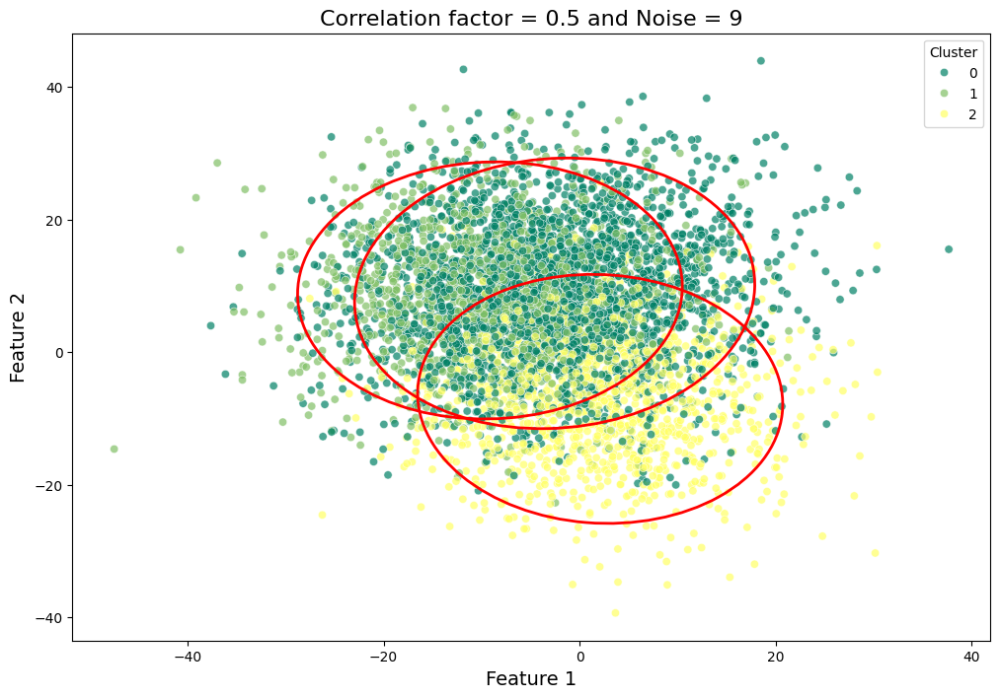

In [ ]:
plt.figure(figsize=(12,8))
sns.scatterplot(
    data=X,
    x="var_1",
    y="var_2",
    hue="target",
    palette="summer",
    alpha=0.7
)

plt.xlabel("Feature 1", fontsize=14)
plt.ylabel("Feature 2", fontsize=14)
plt.legend(title="Cluster")
plt.title(f'Correlation factor = {CORRELATION} and Noise = {NOISE_STD}', fontsize=16)

def plot_cov_ellipse(mean, cov, ax, n_std=2.0, **kwargs):
    vals, vecs = np.linalg.eigh(cov)
    order = vals.argsort()[::-1]
    vals, vecs = vals[order], vecs[:, order]
    theta = np.degrees(np.arctan2(*vecs[:,0][::-1]))
    width, height = 2 * n_std * np.sqrt(vals)
    ell = Ellipse(xy=mean, width=width, height=height,
                  angle=theta, fill=False, **kwargs)
    ax.add_patch(ell)

ax = plt.gca()

for cluster in np.unique(X['target']):
    cluster_data = X[X['target'] == cluster][['var_1','var_2']].values
    mean = cluster_data.mean(axis=0)
    cov = np.cov(cluster_data, rowvar=False)
    plot_cov_ellipse(mean, cov, ax, edgecolor='red', linewidth=2)

# plt.savefig(f"corr_{CORRELATION}_noise_{NOISE_STD}.pdf")
plt.show()

In [544]:
# sns.pairplot(X, hue="target", palette=['#66B366', '#028065', '#E6F366'], diag_kind="kde", height=2.5)

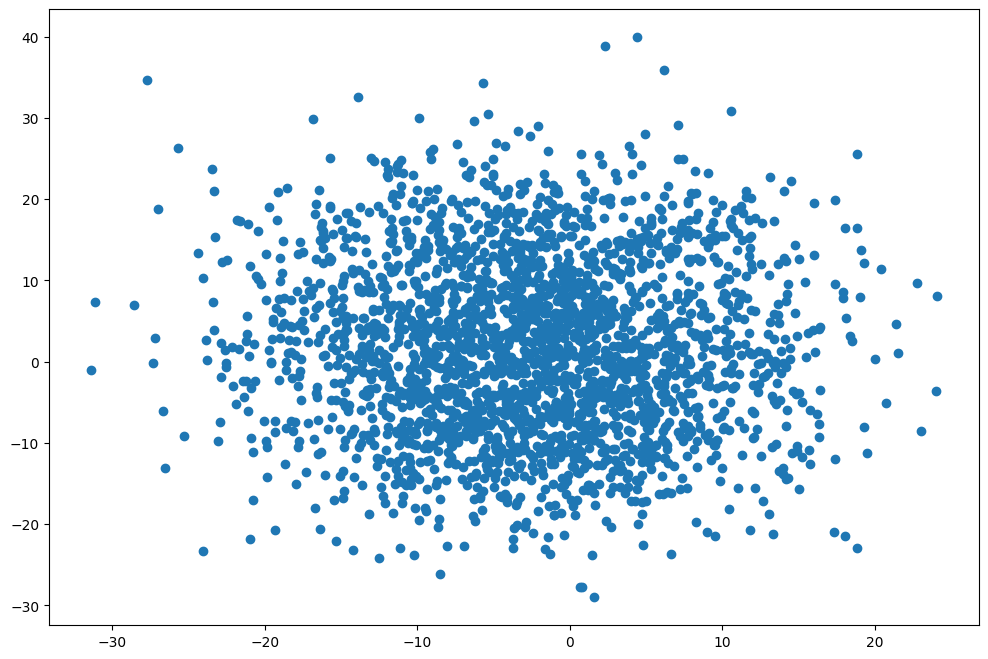

In [545]:
plt.figure(figsize=(12,8))
plt.scatter(X['var_1'],X['var_2'])
plt.show()

In [546]:
corr_dataset = pd.DataFrame(X) 

## correlation matrix

In [547]:
corr_dataset.iloc[:,:-1].corr()

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15
var_1,1.000000,-0.023368,-0.142672,0.150819,0.145767,0.032065,0.073165,-0.056482,0.135433,-0.031609,-0.134983,0.067432,-0.137687,0.093473,0.101321
var_2,-0.023368,1.000000,0.333171,-0.090476,-0.324768,-0.361086,-0.146611,0.464750,0.014844,0.196027,-0.253271,0.397210,0.371470,-0.391906,0.009868
var_3,-0.142672,0.333171,1.000000,-0.156538,-0.353048,-0.268226,-0.137642,0.327092,-0.072923,0.152818,-0.054488,0.202784,0.354859,-0.285386,-0.051989
var_4,0.150819,-0.090476,-0.156538,1.000000,0.243691,0.102141,0.110390,-0.118648,0.125594,-0.038283,-0.150647,0.043016,-0.223811,0.166136,0.085723
var_5,0.145767,-0.324768,-0.353048,0.243691,1.000000,0.323074,0.146997,-0.328698,0.076172,-0.187221,0.009563,-0.146274,-0.368626,0.334951,0.048943
var_6,0.032065,-0.361086,-0.268226,0.102141,0.323074,1.000000,0.171243,-0.338577,-0.014240,-0.193466,0.163057,-0.302300,-0.349339,0.332358,-0.001859
var_7,0.073165,-0.146611,-0.137642,0.110390,0.146997,0.171243,1.000000,-0.150762,-0.026280,-0.099471,-0.032254,-0.096638,-0.182944,0.130656,0.056522
var_8,-0.056482,0.464750,0.327092,-0.118648,-0.328698,-0.338577,-0.150762,1.000000,-0.001309,0.236988,-0.220675,0.368191,0.388285,-0.379802,0.000301
var_9,0.135433,0.014844,-0.072923,0.125594,0.076172,-0.014240,-0.026280,-0.001309,1.000000,0.022319,-0.143848,0.078867,-0.043229,0.010727,0.049654
var_10,-0.031609,0.196027,0.152818,-0.038283,-0.187221,-0.193466,-0.099471,0.236988,0.022319,1.000000,-0.137247,0.195208,0.184342,-0.183810,0.025033


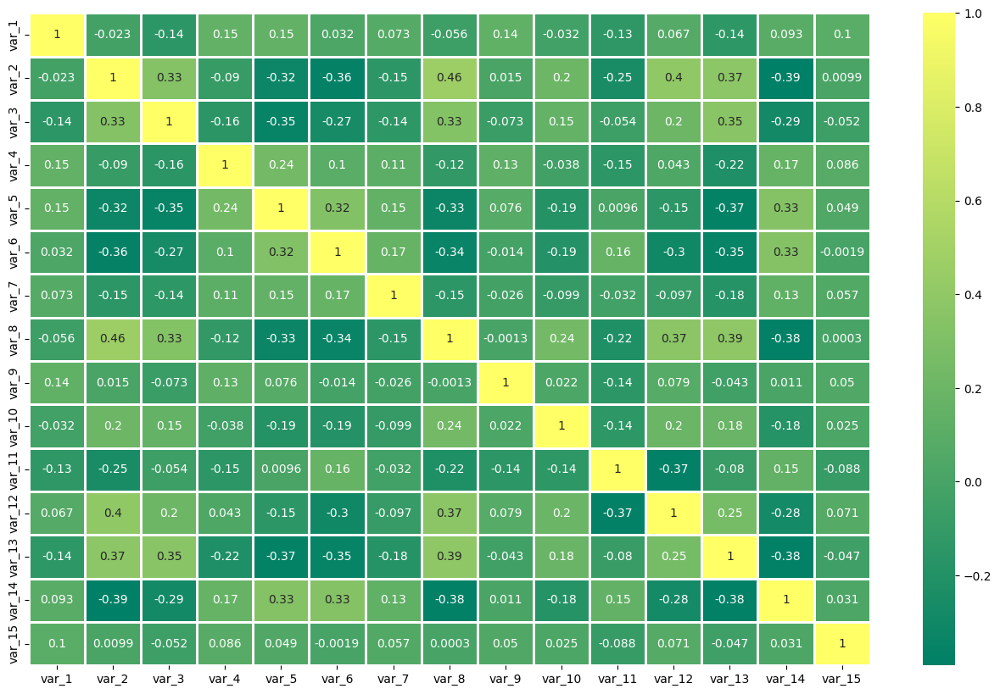

In [548]:
plt.figure(figsize=(16,10))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='summer',annot=True,linewidths=1)
plt.show()

In [549]:
features = corr_dataset.iloc[:, :-1]

In [550]:
corr_matrix = features.corr()

In [551]:
pval_matrix = pd.DataFrame(
    np.ones((len(features.columns), len(features.columns))),
    columns=features.columns,
    index=features.columns
)

for i in range(len(features.columns)):
    for j in range(i+1, len(features.columns)):
        r, p = pearsonr(features.iloc[:, i], features.iloc[:, j])
        pval_matrix.iloc[i, j] = p
        pval_matrix.iloc[j, i] = p


print("Mean Absolute Correlation:", corr_matrix.abs().values[np.triu_indices_from(corr_matrix, k=1)].mean())
print("Max Correlation:", corr_matrix.max().max())
print("Min Correlation:", corr_matrix.min().min())

print("\nMean p-value:", pval_matrix.values[np.triu_indices_from(pval_matrix, k=1)].mean())
print("Minimum p-value:", pval_matrix.values[np.triu_indices_from(pval_matrix, k=1)].min())
print("Maximum p-value:", pval_matrix.values[np.triu_indices_from(pval_matrix, k=1)].max())

Mean Absolute Correlation: 0.16705515929304243
Max Correlation: 1.0
Min Correlation: -0.39190632545948556

Mean p-value: 0.06847062505123673
Minimum p-value: 3.477917874613452e-134
Maximum p-value: 0.9879891624690613


## data standardization

In [552]:
X_values = corr_dataset.iloc[:,:-1].values

In [553]:
y_values = corr_dataset.iloc[:,-1].values

In [554]:
scaler = StandardScaler()

In [555]:
X_values = scaler.fit_transform(X_values)

In [556]:
np.mean(X_values),np.std(X_values)

(-1.0231815394945442e-16, 0.9999999999999999)

In [557]:
X_values = pd.DataFrame(X_values,columns=corr_dataset.iloc[:,:-1].columns)

In [558]:
X_values

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15
0,-2.430304,0.086882,1.500643,-1.101695,-1.149862,-0.669145,-2.157369,0.143811,-0.031344,-0.067369,-1.041196,0.986822,0.950265,-2.246670,0.541926
1,-0.037234,0.815838,0.765276,-0.519984,-0.229519,0.385842,-0.359125,1.350604,-0.064128,0.791128,-0.098647,0.261653,-0.275983,-0.746390,-0.756312
2,0.254433,-0.360096,-1.079004,1.483298,1.562848,1.229125,-0.540341,-1.636917,-1.145909,0.795683,1.471501,-0.099578,-0.634620,0.613660,1.693227
3,-0.495910,-0.191873,-0.676988,0.258118,0.053119,-1.591813,-1.715060,0.983962,0.898351,-0.161179,0.974333,-0.822846,0.195628,-0.984657,1.630914
4,-1.036493,1.702957,0.153528,-1.791642,-0.981390,-0.379442,1.952336,0.669836,-0.167064,0.873866,-1.117318,-0.060956,0.512524,-1.424860,0.133361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.850095,0.370775,-0.139374,0.237927,0.352670,1.059525,0.520211,-0.529605,0.675935,-1.095665,0.128876,-0.030411,-1.645437,0.515100,0.240358
2496,-0.478359,0.810626,-1.073814,-1.887584,-0.156827,-0.730442,0.522611,0.528311,-0.738448,0.822010,0.322361,-0.612541,-1.740065,0.177318,-0.662736
2497,0.929450,-0.818467,0.460400,1.798746,0.367702,1.231054,-0.320888,0.380040,0.322333,-0.175757,0.510221,0.410040,-1.427009,0.422833,0.593489
2498,-0.264396,-1.499895,-0.340350,0.169937,0.563522,-0.918608,-0.819506,-1.407699,1.315916,-0.347464,1.524940,-1.135228,0.623112,-0.311318,-0.313947


# dimensionality reduction algorithms

Summary Table

| Algorithm | Type | Preserves | Scalable | Notes |
|-----------|------|-----------|----------|------|
| **PCA** | Linear | Global variance | ✅ | Fast, good for linear correlations |
| **t-SNE** | Nonlinear | Local structure | ⚠️ | Great for visual clusters, slow for large datasets |
| **UMAP** | Nonlinear | Local + some global | ✅ | Fast, interpretable, scalable |


## pca

**PCA** is a **linear dimensionality reduction** technique that projects data onto a set of orthogonal axes (principal components) which capture the **maximum variance**.

1. Standardize the dataset (mean=0, variance=1).  
2. Compute the **covariance matrix** of the features.  
3. Compute **eigenvectors and eigenvalues** of the covariance matrix.  
4. Select the top `k` eigenvectors (principal components) and project the data onto them.

**Key Points:**
- Preserves **global structure and variance**  
- Produces a **linear embedding**  
- Each principal component is a linear combination of original features

**Strengths**
- Fast and deterministic  
- Works well for linear data correlations  
- Useful for noise reduction and preprocessing  

**Weaknesses**
- Cannot capture nonlinear structures  
- Sensitive to scaling of features  

In [559]:
pca_general = PCA()

In [560]:
pca_general.fit(X_values)

,n_components,None
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [561]:
explained_variance = pca_general.explained_variance_ratio_

In [562]:
explained_variance

array([0.24561273, 0.11690432, 0.0670689 , 0.06300926, 0.05962632,
       0.05649006, 0.05588693, 0.05098231, 0.04725607, 0.04418495,
       0.04148371, 0.04036121, 0.03905786, 0.0371258 , 0.03494958])

In [563]:
eigenvalues = pca_general.explained_variance_

In [564]:
eigenvalues

array([3.68566521, 1.75426649, 1.00643605, 0.94551706, 0.89475265,
       0.84768996, 0.83863934, 0.76504073, 0.70912471, 0.66303939,
       0.62250469, 0.60566046, 0.58610233, 0.55710982, 0.5244535 ])

In [565]:
eigenvalues[1]

1.7542664866541056

In [566]:
selected_components = []

for i in eigenvalues:
    if i > 1:
        selected_components.append(i)
    
print(selected_components)

[3.6856652052183407, 1.7542664866541056, 1.00643604709711]


In [567]:
N_COMPONENTS = len(selected_components)

In [568]:
eigenvectors = pca_general.components_

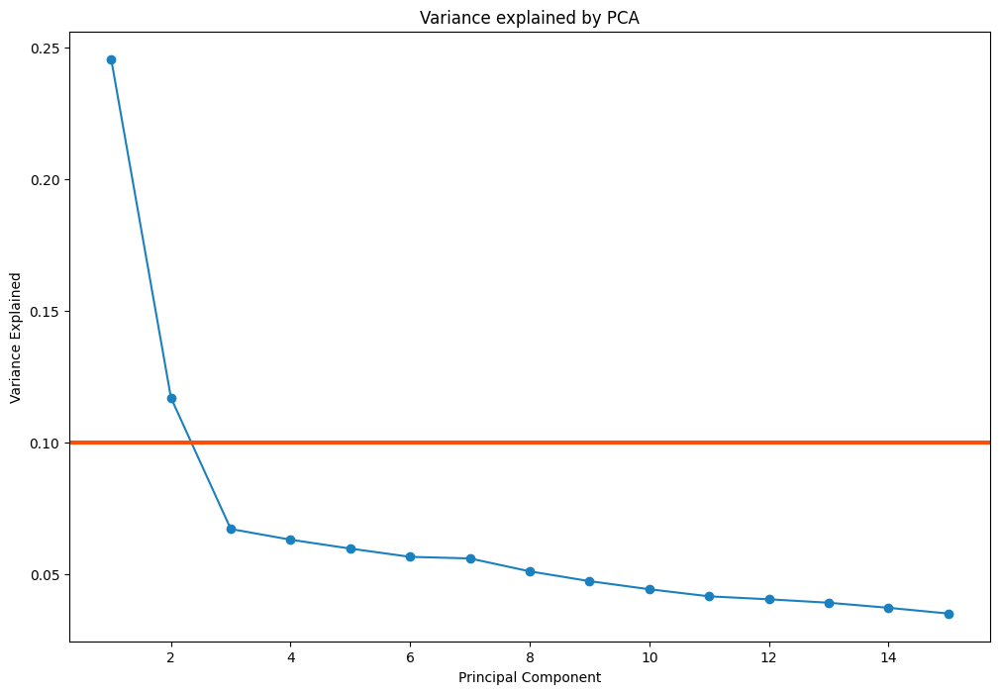

In [569]:
plt.figure(figsize=(12,8))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [570]:
pca = PCA(n_components=N_COMPONENTS)

In [571]:
X_pca = pca.fit_transform(X_values)

In [572]:
pca_columns = [f'dim_{i+1}' for i in range(N_COMPONENTS)]

In [573]:
X_pca = pd.DataFrame(X_pca, columns=pca_columns)

In [574]:
X_pca

,dim_1,dim_2,dim_3
0,3.318119,1.307632,-0.583770
1,1.525994,0.236831,-0.238119
2,-2.625702,-0.395965,0.551334
3,0.800585,0.163327,-1.198102
4,2.365123,0.371408,1.838735
...,...,...,...
2495,-1.830113,-1.287129,-0.051732
2496,-0.039084,1.062949,0.403339
2497,-1.460975,-1.279639,-0.186106
2498,-1.241288,1.125036,-1.911574


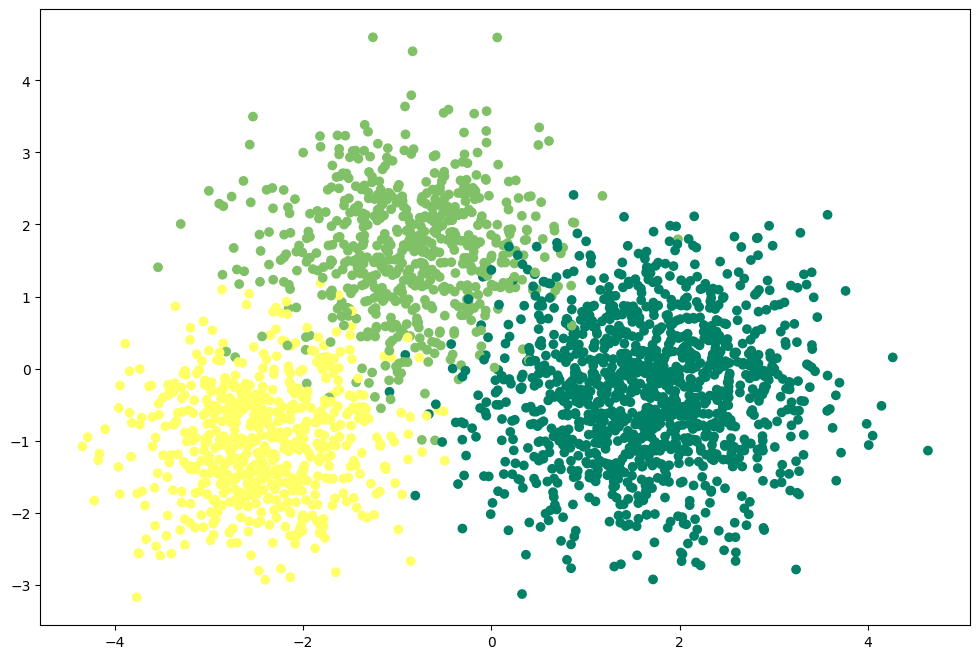

In [575]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=X_pca['dim_1'],y=X_pca['dim_2'],c=corr_dataset['target'],cmap='summer')
plt.show()

## t-SNE

**t-SNE** is a **nonlinear technique** primarily used for **visualizing high-dimensional data** in 2 or 3 dimensions.

1. Compute **pairwise similarities** in high-dimensional space using conditional probabilities.  
2. Initialize points randomly in low-dimensional space.  
3. Minimize the **Kullback–Leibler divergence** between high-dimensional and low-dimensional similarity distributions via gradient descent.  
4. Emphasizes **local neighborhood preservation**, sometimes at the expense of global structure.

**Key Points:**
- Focuses on preserving **local structure** (nearby points remain close)  
- Often used for **visualizing clusters** in 2D/3D plots  

**Strengths**
- Captures complex, nonlinear relationships  
- Reveals hidden patterns and clusters visually  

**Weaknesses**
- Computationally expensive for large datasets  
- Non-deterministic unless `random_state` is fixed  
- Poor at preserving global distances  


In [576]:
tsne = TSNE(n_components=2,random_state=42)

In [577]:
X_tsne = tsne.fit_transform(X_values)

In [578]:
X_tsne = pd.DataFrame(X_tsne,columns=('dim_1','dim_2'))

In [579]:
X_tsne 

,dim_1,dim_2
0,27.232327,19.136248
1,28.245445,-3.569001
2,-44.882462,-14.700111
3,34.280273,-13.941455
4,17.900047,2.124485
...,...,...
2495,-50.065445,8.796386
2496,-2.117289,-8.720896
2497,-42.465763,-2.226987
2498,-14.853291,1.170913


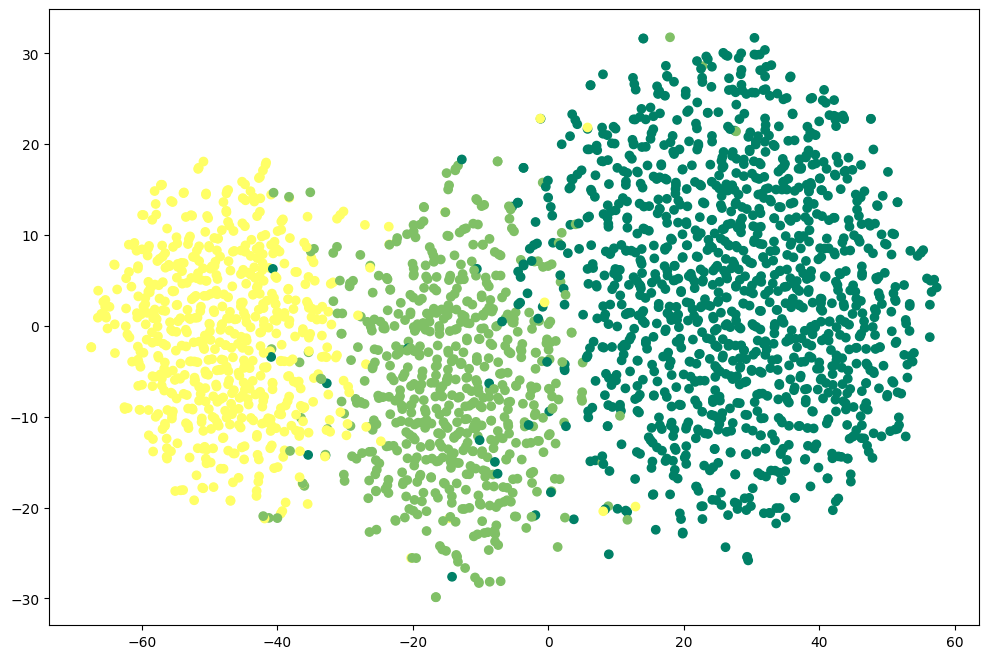

In [580]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=X_tsne['dim_1'],y=X_tsne['dim_2'],c=corr_dataset['target'],cmap='summer')
plt.show()

## umap

**UMAP** is a **nonlinear dimensionality reduction** technique based on **manifold learning and topological data analysis**.  
It aims to preserve both **local and some global structure** in a low-dimensional embedding.

1. Construct a **nearest-neighbor graph** of the high-dimensional data.  
2. Estimate a **fuzzy topological structure** (simplicial complex).  
3. Optimize a **cross-entropy loss** to map the high-dimensional structure into a lower-dimensional space.  
4. Output is a low-dimensional embedding suitable for visualization or clustering.

**Key Points:**
- Can capture **nonlinear structures** efficiently  
- Usually faster and more scalable than t-SNE  
- Balances **local neighborhood preservation** with **global structure**

**Strengths**
- Handles large datasets efficiently  
- Preserves both local and some global patterns  
- Often produces more interpretable embeddings than t-SNE  

**Weaknesses**
- Sensitive to data scaling and preprocessing  


In [581]:
umap = umap.UMAP(n_components=3,random_state=42)

In [582]:
X_umap = umap.fit_transform(X_values)

In [583]:
X_umap = pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3'))

In [584]:
X_umap

,dim_1,dim_2,dim_3
0,-1.696692,5.271500,6.727437
1,-1.369872,5.945000,5.528481
2,4.343482,7.803823,5.311739
3,-0.649922,6.480950,6.926208
4,-1.606864,6.575488,5.429632
...,...,...,...
2495,4.591097,8.220700,4.815832
2496,2.187583,5.350585,6.522120
2497,4.363436,7.914960,4.392569
2498,2.036628,4.874263,5.369936


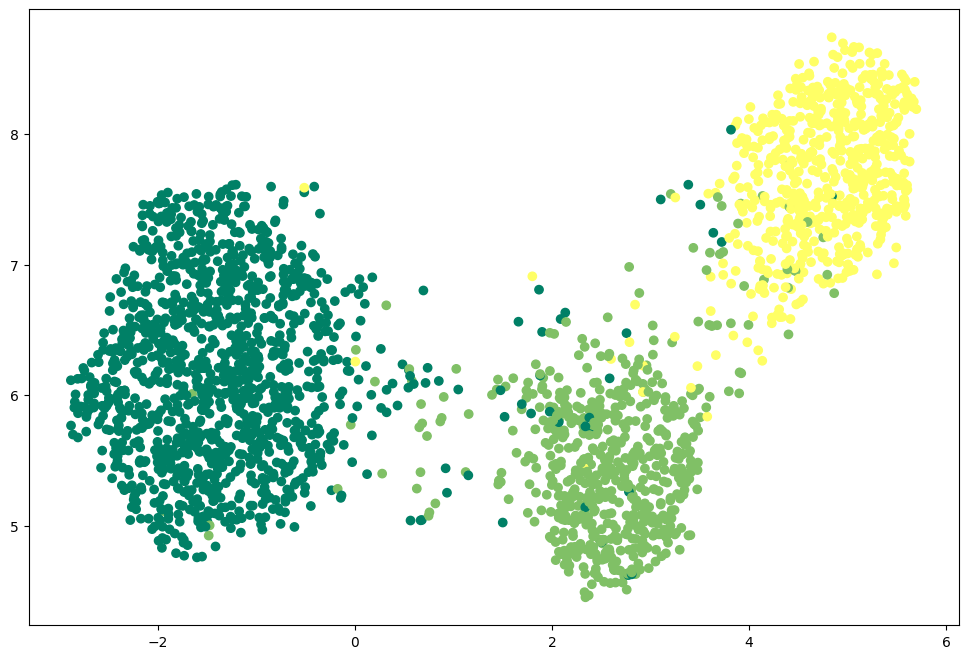

In [585]:
fig = plt.figure(figsize=(12,8))
plt.scatter(X_umap['dim_1'],X_umap['dim_2'],c=corr_dataset['target'],cmap='summer')
plt.show()

# clustering algorithms

| Algorithm | Type | Handles Nonlinear Shapes | Robust to Outliers | Scalable | Notes |
|------------|------|--------------------------|--------------------|-----------|-------|
| **K-Means** | Centroid-based | ❌ | ❌ | ✅ | Simple, fast, but assumes spherical clusters |
| **BIRCH** | Hierarchical | ⚠️ Partial | ⚠️ Partial | ✅✅ | Excellent for very large data |
| **GMM** | Probabilistic | ✅ | ⚠️ Partial | ⚠️ | Flexible, probabilistic clustering |
| **PAM** | Medoid-based | ✅ | ✅ | ❌ | Robust but slow |
| **Spectral** | Graph-based | ✅✅ | ⚠️ | ❌ | Captures complex cluster structures |

## k-means - CENTROID BASED CLUSTERING ALGORITHM TYPE

**K-Means** is one of the most classic and widely used clustering algorithms.  
Given a desired number of clusters `k`, the algorithm seeks to partition the dataset into `k` groups such that the **sum of squared distances** from each point to its cluster’s center (centroid) is minimized.

1. **Assignment step:** Assign each data point to the nearest centroid (using Euclidean distance).  
2. **Update step:** Recompute each centroid as the mean of all points assigned to it.  
3. Repeat until convergence (centroids stop changing significantly).

K-Means produces **hard clusters** — each point belongs to exactly one cluster. It assumes clusters are roughly **spherical** and similar in size.

**Strengths**
- Simple and computationally efficient  
- Works well on medium-sized, numeric datasets  
- Fast convergence with `k-means++` initialization  

**Weaknesses**
- Sensitive to outliers  
- Assumes spherical, balanced clusters  
- Requires specifying `k`  
- Can converge to local minima  


In [586]:
kmeans = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [587]:
kmeans.fit(X_values)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [588]:
df_kmeans = X_values.copy()

In [589]:
df_kmeans['target'] = corr_dataset['target']

In [590]:
df_kmeans['k_means'] = kmeans.labels_

In [591]:
df_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,k_means
0,-2.430304,0.086882,1.500643,-1.101695,-1.149862,-0.669145,-2.157369,0.143811,-0.031344,-0.067369,-1.041196,0.986822,0.950265,-2.246670,0.541926,0,2
1,-0.037234,0.815838,0.765276,-0.519984,-0.229519,0.385842,-0.359125,1.350604,-0.064128,0.791128,-0.098647,0.261653,-0.275983,-0.746390,-0.756312,0,2
2,0.254433,-0.360096,-1.079004,1.483298,1.562848,1.229125,-0.540341,-1.636917,-1.145909,0.795683,1.471501,-0.099578,-0.634620,0.613660,1.693227,2,0
3,-0.495910,-0.191873,-0.676988,0.258118,0.053119,-1.591813,-1.715060,0.983962,0.898351,-0.161179,0.974333,-0.822846,0.195628,-0.984657,1.630914,0,2
4,-1.036493,1.702957,0.153528,-1.791642,-0.981390,-0.379442,1.952336,0.669836,-0.167064,0.873866,-1.117318,-0.060956,0.512524,-1.424860,0.133361,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.850095,0.370775,-0.139374,0.237927,0.352670,1.059525,0.520211,-0.529605,0.675935,-1.095665,0.128876,-0.030411,-1.645437,0.515100,0.240358,2,0
2496,-0.478359,0.810626,-1.073814,-1.887584,-0.156827,-0.730442,0.522611,0.528311,-0.738448,0.822010,0.322361,-0.612541,-1.740065,0.177318,-0.662736,1,1
2497,0.929450,-0.818467,0.460400,1.798746,0.367702,1.231054,-0.320888,0.380040,0.322333,-0.175757,0.510221,0.410040,-1.427009,0.422833,0.593489,2,0
2498,-0.264396,-1.499895,-0.340350,0.169937,0.563522,-0.918608,-0.819506,-1.407699,1.315916,-0.347464,1.524940,-1.135228,0.623112,-0.311318,-0.313947,1,1


In [592]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.242
accuracy after: 0.9596


In [593]:
df_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,k_means
0,-2.430304,0.086882,1.500643,-1.101695,-1.149862,-0.669145,-2.157369,0.143811,-0.031344,-0.067369,-1.041196,0.986822,0.950265,-2.246670,0.541926,0,0
1,-0.037234,0.815838,0.765276,-0.519984,-0.229519,0.385842,-0.359125,1.350604,-0.064128,0.791128,-0.098647,0.261653,-0.275983,-0.746390,-0.756312,0,0
2,0.254433,-0.360096,-1.079004,1.483298,1.562848,1.229125,-0.540341,-1.636917,-1.145909,0.795683,1.471501,-0.099578,-0.634620,0.613660,1.693227,2,2
3,-0.495910,-0.191873,-0.676988,0.258118,0.053119,-1.591813,-1.715060,0.983962,0.898351,-0.161179,0.974333,-0.822846,0.195628,-0.984657,1.630914,0,0
4,-1.036493,1.702957,0.153528,-1.791642,-0.981390,-0.379442,1.952336,0.669836,-0.167064,0.873866,-1.117318,-0.060956,0.512524,-1.424860,0.133361,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.850095,0.370775,-0.139374,0.237927,0.352670,1.059525,0.520211,-0.529605,0.675935,-1.095665,0.128876,-0.030411,-1.645437,0.515100,0.240358,2,2
2496,-0.478359,0.810626,-1.073814,-1.887584,-0.156827,-0.730442,0.522611,0.528311,-0.738448,0.822010,0.322361,-0.612541,-1.740065,0.177318,-0.662736,1,1
2497,0.929450,-0.818467,0.460400,1.798746,0.367702,1.231054,-0.320888,0.380040,0.322333,-0.175757,0.510221,0.410040,-1.427009,0.422833,0.593489,2,2
2498,-0.264396,-1.499895,-0.340350,0.169937,0.563522,-0.918608,-0.819506,-1.407699,1.315916,-0.347464,1.524940,-1.135228,0.623112,-0.311318,-0.313947,1,1


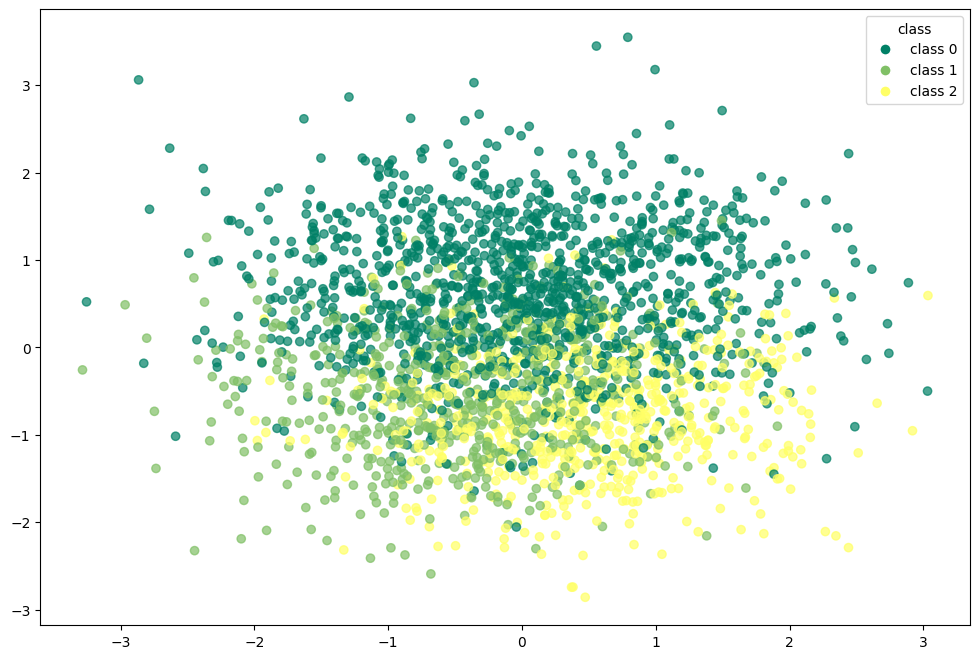

In [594]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

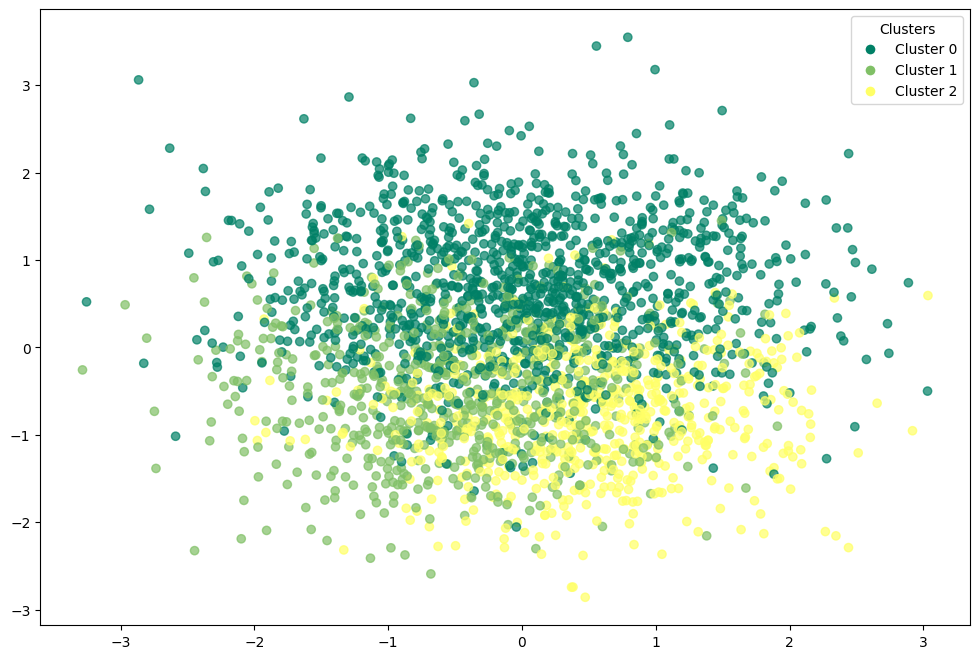

In [595]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [596]:
kmeans.cluster_centers_

array([[ 0.49873071, -0.75787605, -0.8865692 ,  0.71499806,  1.0577316 ,
         0.71728261,  0.45863565, -0.78676794,  0.29944938, -0.36283454,
        -0.17191269, -0.29083229, -0.98774064,  0.86588568,  0.23966488],
       [-0.51484061, -0.51516005,  0.04004173, -0.52670536, -0.2073193 ,
         0.32681087, -0.0502456 , -0.43724773, -0.47443137, -0.27657039,
         1.01545349, -0.8694026 , -0.05677454,  0.20401422, -0.31540939],
       [ 0.01298448,  0.69076204,  0.45614051, -0.09713692, -0.45683903,
        -0.56573664, -0.21979759,  0.6636783 ,  0.0983161 ,  0.34709624,
        -0.46334048,  0.63289296,  0.56370998, -0.57862728,  0.04347667]])

In [597]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1193   47   10]
 [   5  595   25]
 [   0   14  611]]


In [598]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97      1250
           1       0.91      0.95      0.93       625
           2       0.95      0.98      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.96      2500
weighted avg       0.96      0.96      0.96      2500



In [599]:
adjusted_rand_score(df_kmeans['target'],df_kmeans['k_means'])

0.890434942017451

In [600]:
normalized_mutual_info_score(df_kmeans['target'],df_kmeans['k_means'])

0.8309993560089924

In [601]:
silhouette_score(df_kmeans.drop(columns=['target','k_means']).values,df_kmeans['k_means'])

0.15308890662823518

### k-means with pca

In [602]:
kmeans_pca = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [603]:
kmeans_pca.fit(X_pca)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [604]:
df_pca_kmeans = X_pca.copy()

In [605]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [606]:
df_pca_kmeans['target'] = corr_dataset['target']

In [607]:
df_pca_kmeans

,dim_1,dim_2,dim_3,kmeans_pca,target
0,3.318119,1.307632,-0.583770,2,0
1,1.525994,0.236831,-0.238119,2,0
2,-2.625702,-0.395965,0.551334,0,2
3,0.800585,0.163327,-1.198102,2,0
4,2.365123,0.371408,1.838735,2,0
...,...,...,...,...,...
2495,-1.830113,-1.287129,-0.051732,0,2
2496,-0.039084,1.062949,0.403339,1,1
2497,-1.460975,-1.279639,-0.186106,0,2
2498,-1.241288,1.125036,-1.911574,1,1


In [608]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.2416
accuracy after: 0.956


In [609]:
df_pca_kmeans

,dim_1,dim_2,dim_3,kmeans_pca,target
0,3.318119,1.307632,-0.583770,0,0
1,1.525994,0.236831,-0.238119,0,0
2,-2.625702,-0.395965,0.551334,2,2
3,0.800585,0.163327,-1.198102,0,0
4,2.365123,0.371408,1.838735,0,0
...,...,...,...,...,...
2495,-1.830113,-1.287129,-0.051732,2,2
2496,-0.039084,1.062949,0.403339,1,1
2497,-1.460975,-1.279639,-0.186106,2,2
2498,-1.241288,1.125036,-1.911574,1,1


In [610]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1189   49   12]
 [   5  592   28]
 [   0   16  609]]


In [611]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97      1250
           1       0.90      0.95      0.92       625
           2       0.94      0.97      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.95      2500
weighted avg       0.96      0.96      0.96      2500



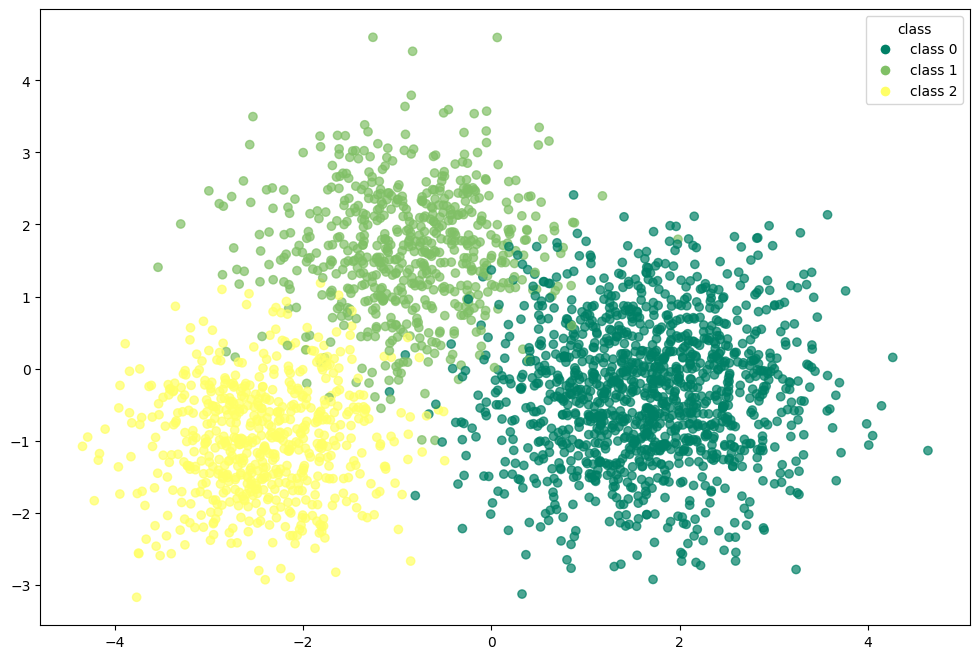

In [612]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

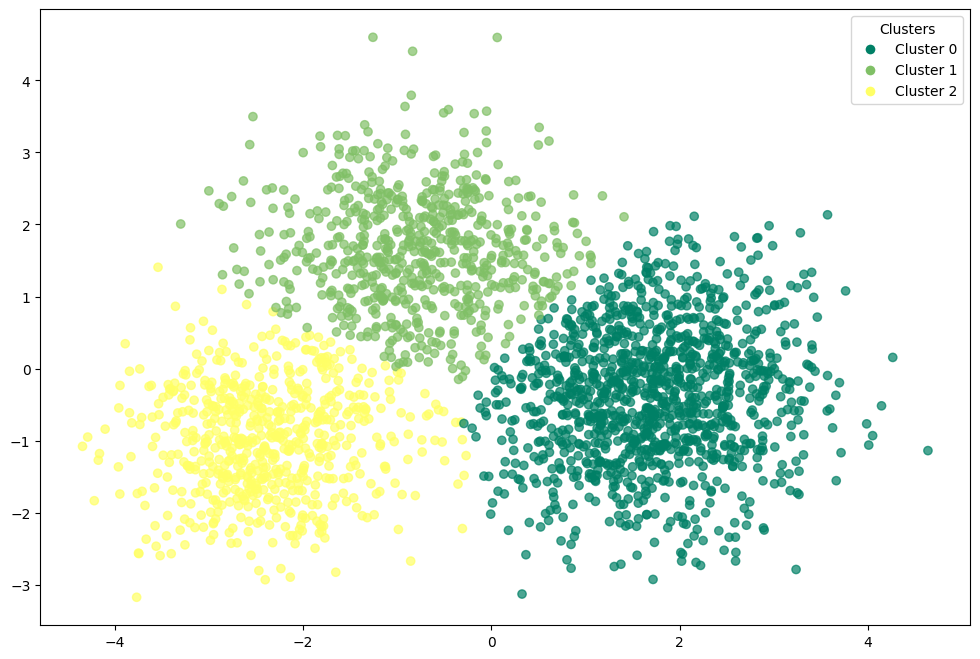

In [613]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [614]:
adjusted_rand_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.8815395400762848

In [615]:
normalized_mutual_info_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.8191141268575541

In [616]:
silhouette_score(df_pca_kmeans.drop(columns=['target','kmeans_pca']).values,df_pca_kmeans['kmeans_pca'])

0.42160986068664724

### k-means with t-SNE

In [617]:
kmeans_tsne = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [618]:
kmeans_tsne.fit(X_tsne)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [619]:
df_tsne_kmeans = X_tsne.copy()

In [620]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [621]:
df_tsne_kmeans['target'] = corr_dataset['target']

In [622]:
df_tsne_kmeans

,dim_1,dim_2,kmeans_tsne,target
0,27.232327,19.136248,1,0
1,28.245445,-3.569001,1,0
2,-44.882462,-14.700111,0,2
3,34.280273,-13.941455,1,0
4,17.900047,2.124485,1,0
...,...,...,...,...
2495,-50.065445,8.796386,0,2
2496,-2.117289,-8.720896,2,1
2497,-42.465763,-2.226987,0,2
2498,-14.853291,1.170913,2,1


In [623]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.0092
accuracy after: 0.9308


In [624]:
df_tsne_kmeans

,dim_1,dim_2,kmeans_tsne,target
0,27.232327,19.136248,0,0
1,28.245445,-3.569001,0,0
2,-44.882462,-14.700111,2,2
3,34.280273,-13.941455,0,0
4,17.900047,2.124485,0,0
...,...,...,...,...
2495,-50.065445,8.796386,2,2
2496,-2.117289,-8.720896,1,1
2497,-42.465763,-2.226987,2,2
2498,-14.853291,1.170913,1,1


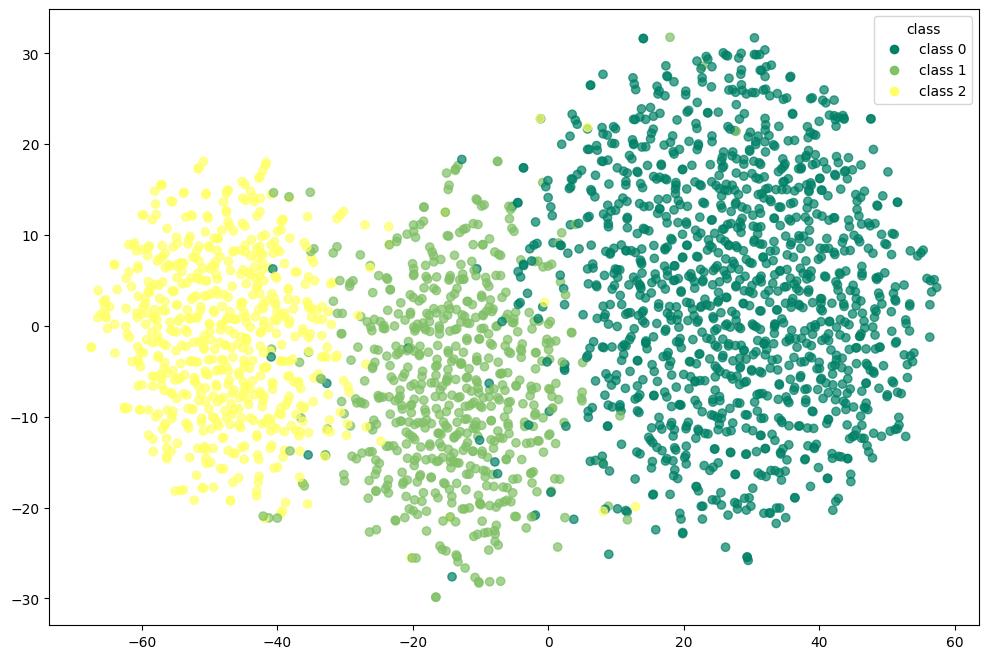

In [625]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

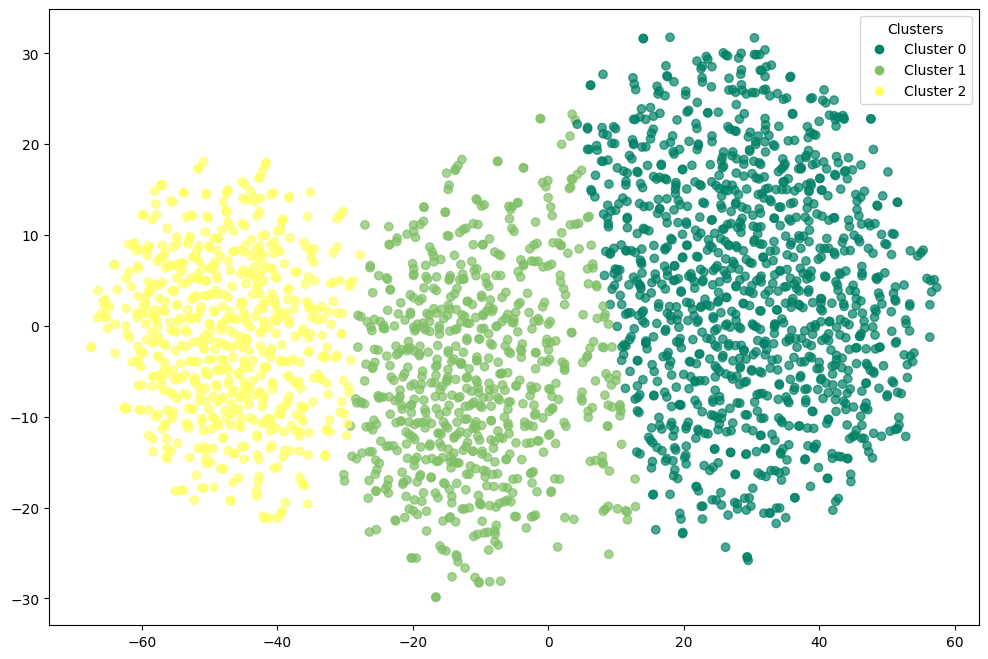

In [626]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [627]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[1130  115    5]
 [   3  588   34]
 [   1   15  609]]


In [628]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.90      0.95      1250
           1       0.82      0.94      0.88       625
           2       0.94      0.97      0.96       625

    accuracy                           0.93      2500
   macro avg       0.92      0.94      0.93      2500
weighted avg       0.94      0.93      0.93      2500



In [629]:
adjusted_rand_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.8105672497234371

In [630]:
normalized_mutual_info_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.7678928616824013

In [631]:
silhouette_score(df_tsne_kmeans.drop(columns=['target','kmeans_tsne']).values,df_tsne_kmeans['kmeans_tsne'])

0.49578985571861267

### k-means with umap

In [632]:
kmeans_umap = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [633]:
kmeans_umap.fit(X_umap)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [634]:
df_umap_kmeans = X_umap.copy()

In [635]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [636]:
df_umap_kmeans['target'] = corr_dataset['target']

In [637]:
df_umap_kmeans

,dim_1,dim_2,dim_3,kmeans_umap,target
0,-1.696692,5.271500,6.727437,1,0
1,-1.369872,5.945000,5.528481,1,0
2,4.343482,7.803823,5.311739,0,2
3,-0.649922,6.480950,6.926208,1,0
4,-1.606864,6.575488,5.429632,1,0
...,...,...,...,...,...
2495,4.591097,8.220700,4.815832,0,2
2496,2.187583,5.350585,6.522120,2,1
2497,4.363436,7.914960,4.392569,0,2
2498,2.036628,4.874263,5.369936,2,1


In [638]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.0124
accuracy after: 0.9628


In [639]:
df_umap_kmeans

,dim_1,dim_2,dim_3,kmeans_umap,target
0,-1.696692,5.271500,6.727437,0,0
1,-1.369872,5.945000,5.528481,0,0
2,4.343482,7.803823,5.311739,2,2
3,-0.649922,6.480950,6.926208,0,0
4,-1.606864,6.575488,5.429632,0,0
...,...,...,...,...,...
2495,4.591097,8.220700,4.815832,2,2
2496,2.187583,5.350585,6.522120,1,1
2497,4.363436,7.914960,4.392569,2,2
2498,2.036628,4.874263,5.369936,1,1


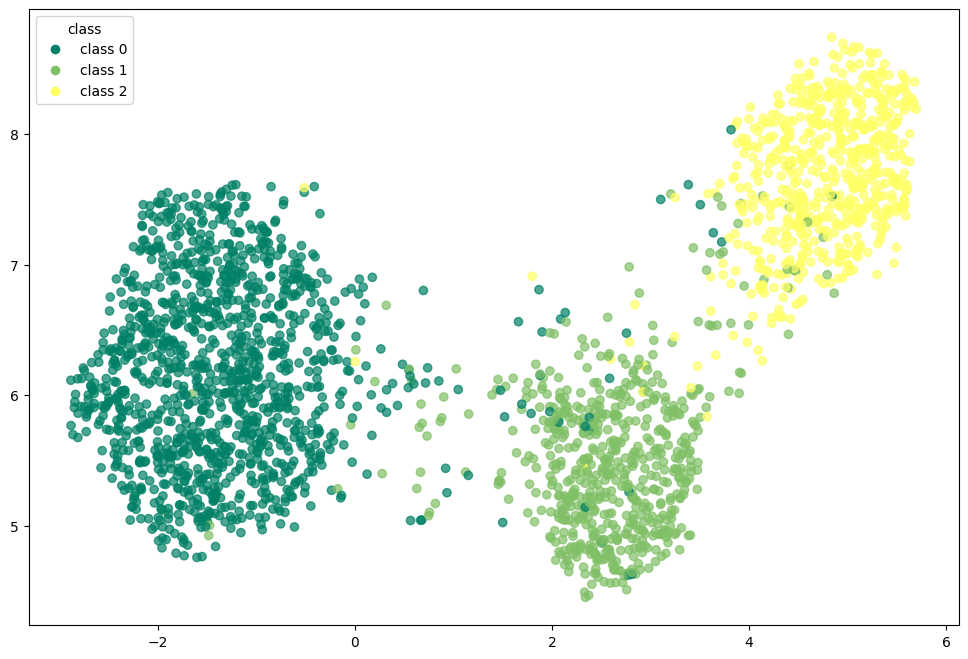

In [640]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

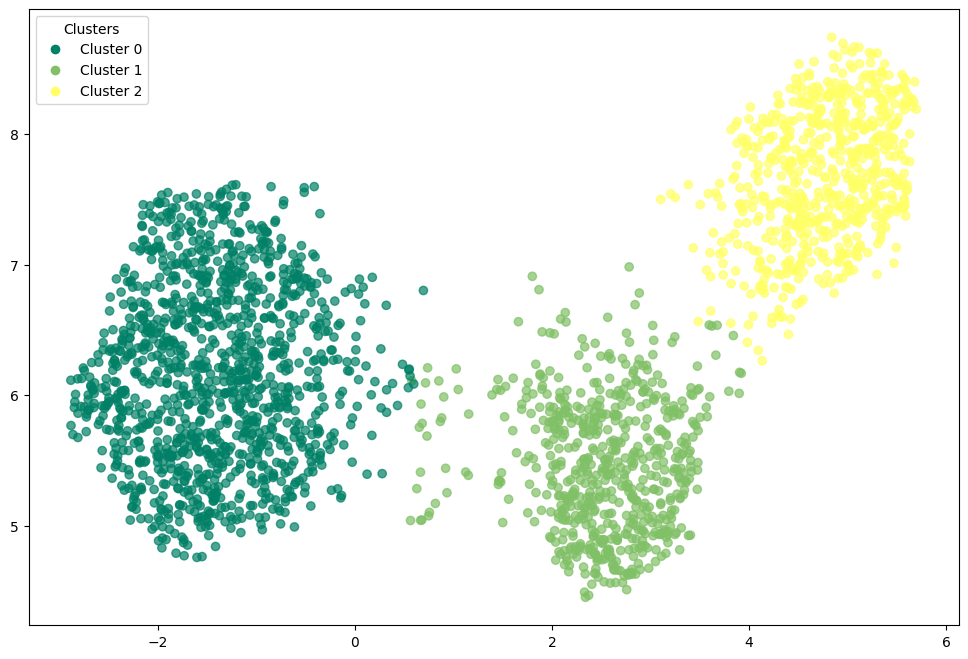

In [641]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [642]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[1210   33    7]
 [  11  587   27]
 [   2   13  610]]


In [643]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1250
           1       0.93      0.94      0.93       625
           2       0.95      0.98      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.96      2500
weighted avg       0.96      0.96      0.96      2500



In [644]:
adjusted_rand_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.9009976916459244

In [645]:
normalized_mutual_info_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.8354183145587576

In [646]:
silhouette_score(df_umap_kmeans.drop(columns=['target','kmeans_umap']).values,df_umap_kmeans['kmeans_umap'])

0.6323453187942505

## Birch - COMPRESSION BASED CLUSTERING ALGORITHM BASED

**BIRCH** is designed for **large-scale datasets**.  
It incrementally builds a **CF tree (Clustering Feature Tree)** — a compact hierarchical structure summarizing the data.  
Each node stores cluster statistics (count, linear sum, squared sum), which can later be reclustered globally.

1. **Build CF tree:** Insert data points, merging them into existing leaf nodes if within a threshold.  
2. **Optional condensing:** Prune or reorganize the tree to simplify its structure.  
3. **Global clustering:** Apply another algorithm (e.g., K-Means) on the CF leaf entries.  
4. **Refinement (optional):** Reassign original points based on the refined clusters.

**Strengths**
- Scales to very large datasets  
- Incremental and memory-efficient  
- Can be used as a preprocessing step  

**Weaknesses**
- Sensitive to threshold parameter  
- Works best with numeric data  
- May lose fine-grained cluster detail  

In [647]:
birch = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [648]:
birch.fit(X_values)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [649]:
df_birch = X_values.copy()

In [650]:
df_birch['birch'] = birch.labels_

In [651]:
df_birch['target'] = corr_dataset['target']

In [652]:
df_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,birch,target
0,-2.430304,0.086882,1.500643,-1.101695,-1.149862,-0.669145,-2.157369,0.143811,-0.031344,-0.067369,-1.041196,0.986822,0.950265,-2.246670,0.541926,0,0
1,-0.037234,0.815838,0.765276,-0.519984,-0.229519,0.385842,-0.359125,1.350604,-0.064128,0.791128,-0.098647,0.261653,-0.275983,-0.746390,-0.756312,0,0
2,0.254433,-0.360096,-1.079004,1.483298,1.562848,1.229125,-0.540341,-1.636917,-1.145909,0.795683,1.471501,-0.099578,-0.634620,0.613660,1.693227,2,2
3,-0.495910,-0.191873,-0.676988,0.258118,0.053119,-1.591813,-1.715060,0.983962,0.898351,-0.161179,0.974333,-0.822846,0.195628,-0.984657,1.630914,0,0
4,-1.036493,1.702957,0.153528,-1.791642,-0.981390,-0.379442,1.952336,0.669836,-0.167064,0.873866,-1.117318,-0.060956,0.512524,-1.424860,0.133361,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.850095,0.370775,-0.139374,0.237927,0.352670,1.059525,0.520211,-0.529605,0.675935,-1.095665,0.128876,-0.030411,-1.645437,0.515100,0.240358,2,2
2496,-0.478359,0.810626,-1.073814,-1.887584,-0.156827,-0.730442,0.522611,0.528311,-0.738448,0.822010,0.322361,-0.612541,-1.740065,0.177318,-0.662736,1,1
2497,0.929450,-0.818467,0.460400,1.798746,0.367702,1.231054,-0.320888,0.380040,0.322333,-0.175757,0.510221,0.410040,-1.427009,0.422833,0.593489,0,2
2498,-0.264396,-1.499895,-0.340350,0.169937,0.563522,-0.918608,-0.819506,-1.407699,1.315916,-0.347464,1.524940,-1.135228,0.623112,-0.311318,-0.313947,1,1


In [653]:
y_true = df_birch['target'].values  
y_kmeans = df_birch['birch'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_birch['birch'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_birch['birch'] == y_true))

accuracy before: 0.93
accuracy after: 0.93


In [654]:
df_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,birch,target
0,-2.430304,0.086882,1.500643,-1.101695,-1.149862,-0.669145,-2.157369,0.143811,-0.031344,-0.067369,-1.041196,0.986822,0.950265,-2.246670,0.541926,0,0
1,-0.037234,0.815838,0.765276,-0.519984,-0.229519,0.385842,-0.359125,1.350604,-0.064128,0.791128,-0.098647,0.261653,-0.275983,-0.746390,-0.756312,0,0
2,0.254433,-0.360096,-1.079004,1.483298,1.562848,1.229125,-0.540341,-1.636917,-1.145909,0.795683,1.471501,-0.099578,-0.634620,0.613660,1.693227,2,2
3,-0.495910,-0.191873,-0.676988,0.258118,0.053119,-1.591813,-1.715060,0.983962,0.898351,-0.161179,0.974333,-0.822846,0.195628,-0.984657,1.630914,0,0
4,-1.036493,1.702957,0.153528,-1.791642,-0.981390,-0.379442,1.952336,0.669836,-0.167064,0.873866,-1.117318,-0.060956,0.512524,-1.424860,0.133361,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.850095,0.370775,-0.139374,0.237927,0.352670,1.059525,0.520211,-0.529605,0.675935,-1.095665,0.128876,-0.030411,-1.645437,0.515100,0.240358,2,2
2496,-0.478359,0.810626,-1.073814,-1.887584,-0.156827,-0.730442,0.522611,0.528311,-0.738448,0.822010,0.322361,-0.612541,-1.740065,0.177318,-0.662736,1,1
2497,0.929450,-0.818467,0.460400,1.798746,0.367702,1.231054,-0.320888,0.380040,0.322333,-0.175757,0.510221,0.410040,-1.427009,0.422833,0.593489,0,2
2498,-0.264396,-1.499895,-0.340350,0.169937,0.563522,-0.918608,-0.819506,-1.407699,1.315916,-0.347464,1.524940,-1.135228,0.623112,-0.311318,-0.313947,1,1


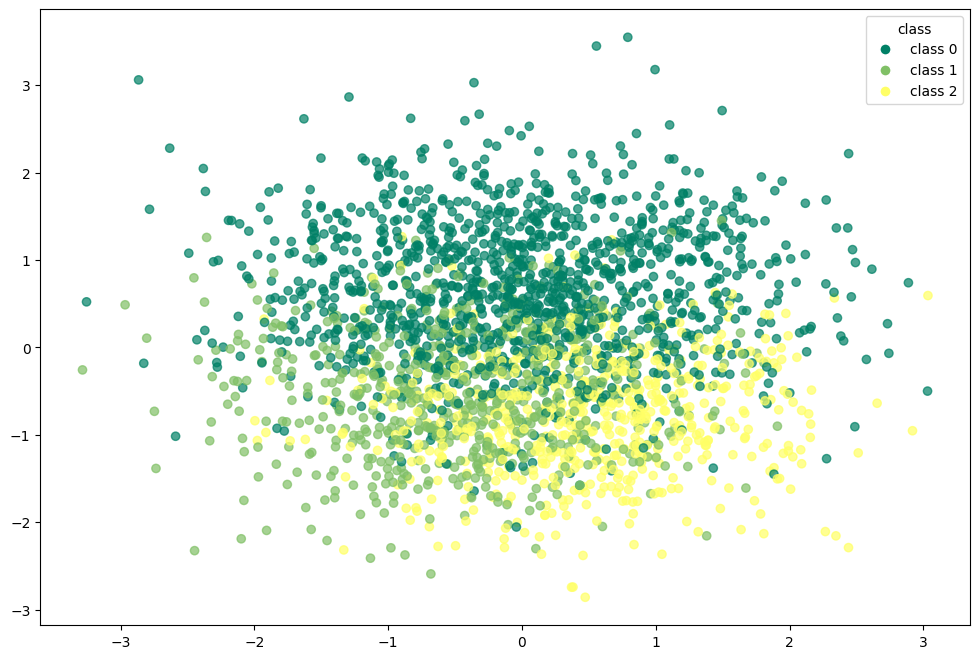

In [655]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

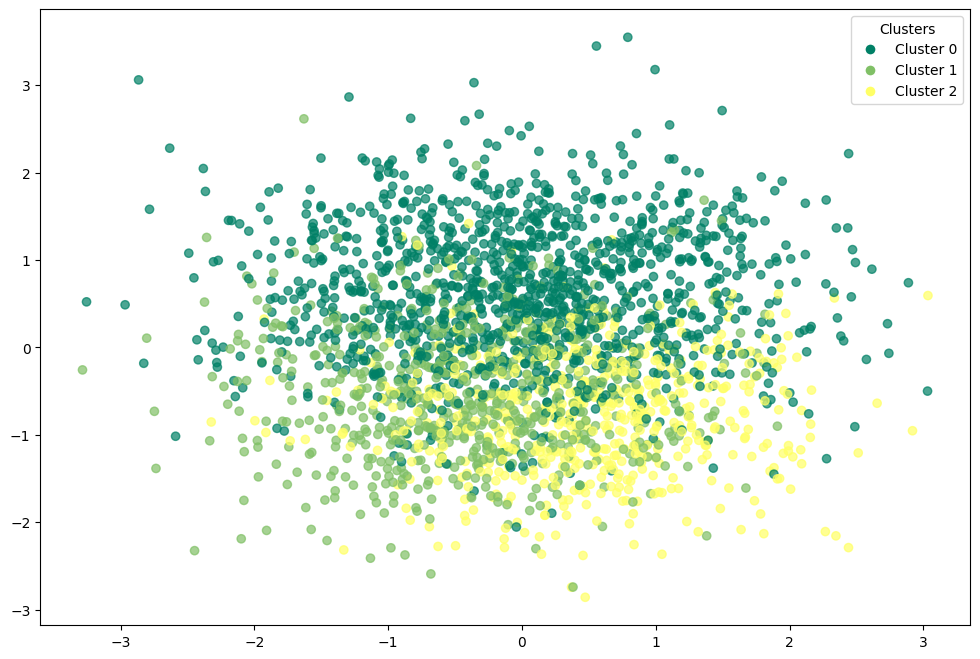

In [656]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['birch'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_birch['birch'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [657]:
print(confusion_matrix(df_birch['target'],df_birch['birch']))

[[1204   39    7]
 [  43  561   21]
 [  11   54  560]]


In [658]:
print(classification_report(df_birch['target'],df_birch['birch']))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96      1250
           1       0.86      0.90      0.88       625
           2       0.95      0.90      0.92       625

    accuracy                           0.93      2500
   macro avg       0.92      0.92      0.92      2500
weighted avg       0.93      0.93      0.93      2500



In [659]:
adjusted_rand_score(df_birch['target'],df_birch['birch'])

0.8191263440403591

In [660]:
normalized_mutual_info_score(df_birch['target'],df_birch['birch'])

0.7282110983046414

In [661]:
silhouette_score(df_birch.drop(columns=['target','birch']).values,df_birch['birch'])

0.1403243197492021

### Birch with pca

In [662]:
birch_pca = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [663]:
birch_pca.fit(X_pca)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [664]:
df_pca_birch = X_pca.copy()

In [665]:
df_pca_birch["birch_pca"] = birch_pca.labels_

In [666]:
df_pca_birch['target'] = corr_dataset['target']

In [667]:
df_pca_birch

,dim_1,dim_2,dim_3,birch_pca,target
0,3.318119,1.307632,-0.583770,0,0
1,1.525994,0.236831,-0.238119,0,0
2,-2.625702,-0.395965,0.551334,2,2
3,0.800585,0.163327,-1.198102,0,0
4,2.365123,0.371408,1.838735,0,0
...,...,...,...,...,...
2495,-1.830113,-1.287129,-0.051732,2,2
2496,-0.039084,1.062949,0.403339,1,1
2497,-1.460975,-1.279639,-0.186106,2,2
2498,-1.241288,1.125036,-1.911574,1,1


In [668]:
y_true = df_pca_birch['target'].values  
y_kmeans = df_pca_birch['birch_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_birch['birch_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_birch['birch_pca'] == y_true))

accuracy before: 0.944
accuracy after: 0.944


In [669]:
df_pca_birch

,dim_1,dim_2,dim_3,birch_pca,target
0,3.318119,1.307632,-0.583770,0,0
1,1.525994,0.236831,-0.238119,0,0
2,-2.625702,-0.395965,0.551334,2,2
3,0.800585,0.163327,-1.198102,0,0
4,2.365123,0.371408,1.838735,0,0
...,...,...,...,...,...
2495,-1.830113,-1.287129,-0.051732,2,2
2496,-0.039084,1.062949,0.403339,1,1
2497,-1.460975,-1.279639,-0.186106,2,2
2498,-1.241288,1.125036,-1.911574,1,1


In [670]:
print(confusion_matrix(df_pca_birch['target'],df_pca_birch['birch_pca']))

[[1180   66    4]
 [   6  605   14]
 [   0   50  575]]


In [671]:
print(classification_report(df_pca_birch['target'],df_pca_birch['birch_pca']))

              precision    recall  f1-score   support

           0       0.99      0.94      0.97      1250
           1       0.84      0.97      0.90       625
           2       0.97      0.92      0.94       625

    accuracy                           0.94      2500
   macro avg       0.93      0.94      0.94      2500
weighted avg       0.95      0.94      0.95      2500



In [672]:
adjusted_rand_score(df_pca_birch['target'],df_pca_birch['birch_pca'])

0.8524610139042852

In [673]:
normalized_mutual_info_score(df_pca_birch['target'],df_pca_birch['birch_pca'])

0.7926227440648536

In [674]:
silhouette_score(df_pca_birch.drop(columns=['target','birch_pca']).values,df_pca_birch['birch_pca'])

0.4042957141653826

### Birch with t-SNE

In [675]:
birch_tsne = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [676]:
birch_tsne.fit(X_tsne)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [677]:
df_tsne_birch = X_tsne.copy()

In [678]:
df_tsne_birch['birch_tsne'] = birch_tsne.labels_

In [679]:
df_tsne_birch['target'] = corr_dataset['target']

In [680]:
df_tsne_birch

,dim_1,dim_2,birch_tsne,target
0,27.232327,19.136248,0,0
1,28.245445,-3.569001,0,0
2,-44.882462,-14.700111,2,2
3,34.280273,-13.941455,0,0
4,17.900047,2.124485,0,0
...,...,...,...,...
2495,-50.065445,8.796386,2,2
2496,-2.117289,-8.720896,1,1
2497,-42.465763,-2.226987,2,2
2498,-14.853291,1.170913,1,1


In [681]:
y_true = df_tsne_birch['target'].values  
y_kmeans = df_tsne_birch['birch_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_birch['birch_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_birch['birch_tsne'] == y_true))

accuracy before: 0.9272
accuracy after: 0.9272


In [682]:
df_tsne_birch

,dim_1,dim_2,birch_tsne,target
0,27.232327,19.136248,0,0
1,28.245445,-3.569001,0,0
2,-44.882462,-14.700111,2,2
3,34.280273,-13.941455,0,0
4,17.900047,2.124485,0,0
...,...,...,...,...
2495,-50.065445,8.796386,2,2
2496,-2.117289,-8.720896,1,1
2497,-42.465763,-2.226987,2,2
2498,-14.853291,1.170913,1,1


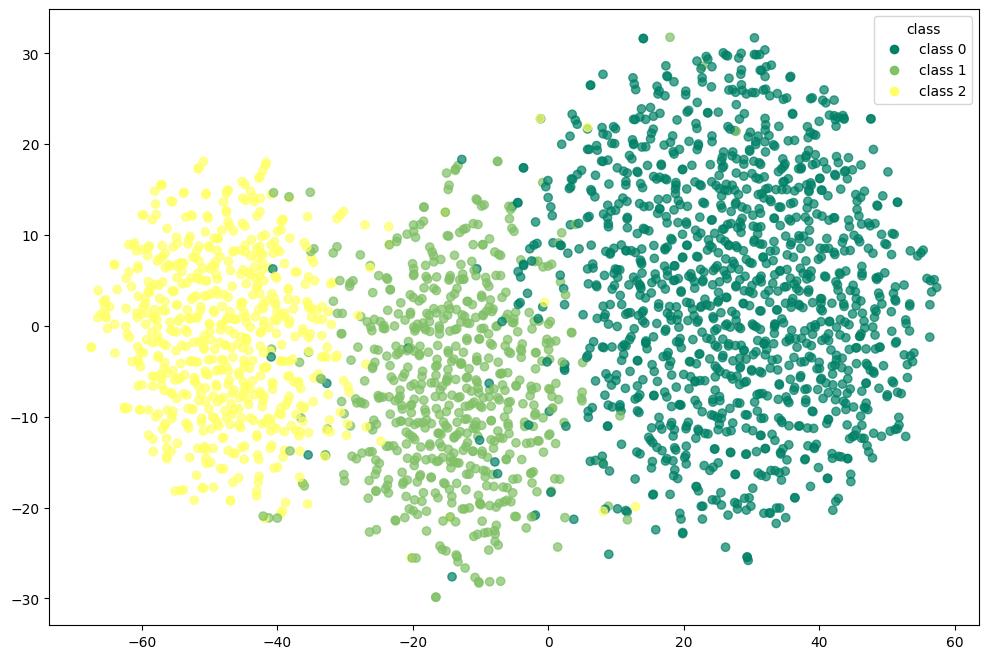

In [683]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

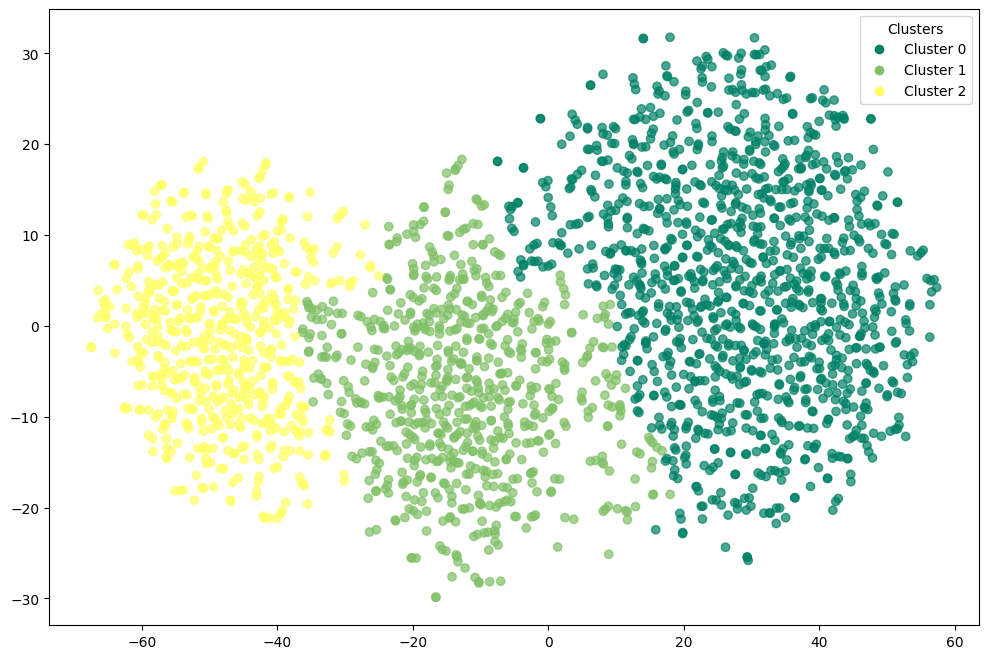

In [684]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['birch_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_birch['birch_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [685]:
print(confusion_matrix(df_tsne_birch['target'],df_tsne_birch['birch_tsne']))

[[1162   84    4]
 [  20  578   27]
 [   2   45  578]]


In [686]:
print(classification_report(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

              precision    recall  f1-score   support

           0       0.98      0.93      0.95      1250
           1       0.82      0.92      0.87       625
           2       0.95      0.92      0.94       625

    accuracy                           0.93      2500
   macro avg       0.92      0.93      0.92      2500
weighted avg       0.93      0.93      0.93      2500



In [687]:
adjusted_rand_score(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])

0.8078797705431301

In [688]:
normalized_mutual_info_score(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])

0.7367906546223888

In [689]:
silhouette_score(df_tsne_birch.drop(columns=['target','birch_tsne']).values,df_tsne_birch['birch_tsne'])

0.47861748933792114

### Birch with umap

In [690]:
birch_umap = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [691]:
birch_umap.fit(X_umap)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [692]:
df_umap_birch = X_umap.copy()

In [693]:
df_umap_birch['birch_umap'] = birch_umap.labels_

In [694]:
df_umap_birch['target'] = corr_dataset['target']

In [695]:
df_umap_birch

,dim_1,dim_2,dim_3,birch_umap,target
0,-1.696692,5.271500,6.727437,1,0
1,-1.369872,5.945000,5.528481,1,0
2,4.343482,7.803823,5.311739,0,2
3,-0.649922,6.480950,6.926208,1,0
4,-1.606864,6.575488,5.429632,1,0
...,...,...,...,...,...
2495,4.591097,8.220700,4.815832,0,2
2496,2.187583,5.350585,6.522120,2,1
2497,4.363436,7.914960,4.392569,0,2
2498,2.036628,4.874263,5.369936,2,1


In [696]:
y_true = df_umap_birch['target'].values  
y_kmeans = df_umap_birch['birch_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_birch['birch_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_birch['birch_umap'] == y_true))

accuracy before: 0.0124
accuracy after: 0.9628


In [697]:
df_umap_birch

,dim_1,dim_2,dim_3,birch_umap,target
0,-1.696692,5.271500,6.727437,0,0
1,-1.369872,5.945000,5.528481,0,0
2,4.343482,7.803823,5.311739,2,2
3,-0.649922,6.480950,6.926208,0,0
4,-1.606864,6.575488,5.429632,0,0
...,...,...,...,...,...
2495,4.591097,8.220700,4.815832,2,2
2496,2.187583,5.350585,6.522120,1,1
2497,4.363436,7.914960,4.392569,2,2
2498,2.036628,4.874263,5.369936,1,1


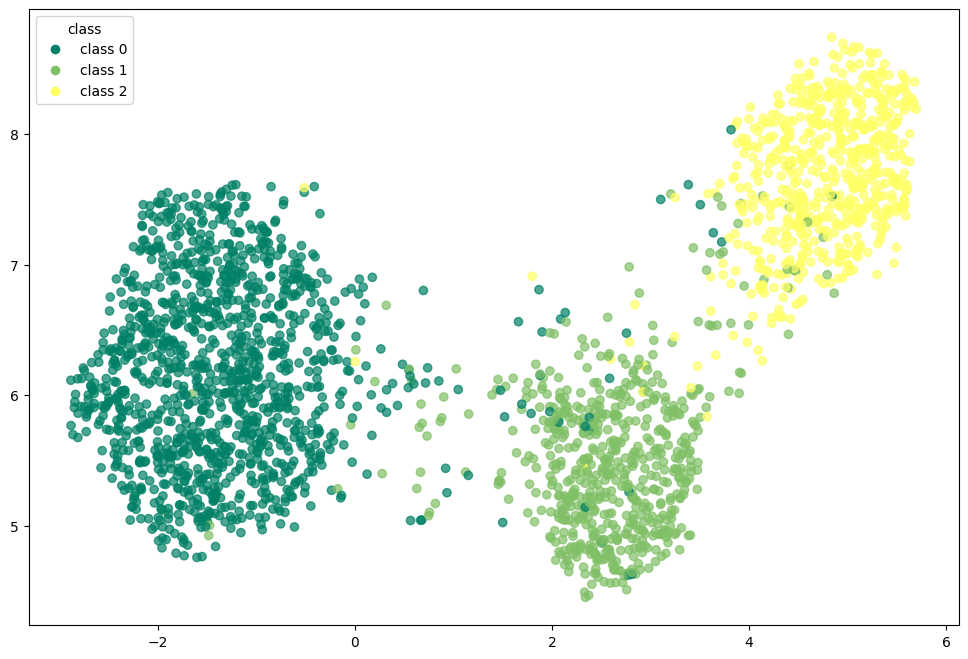

In [698]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

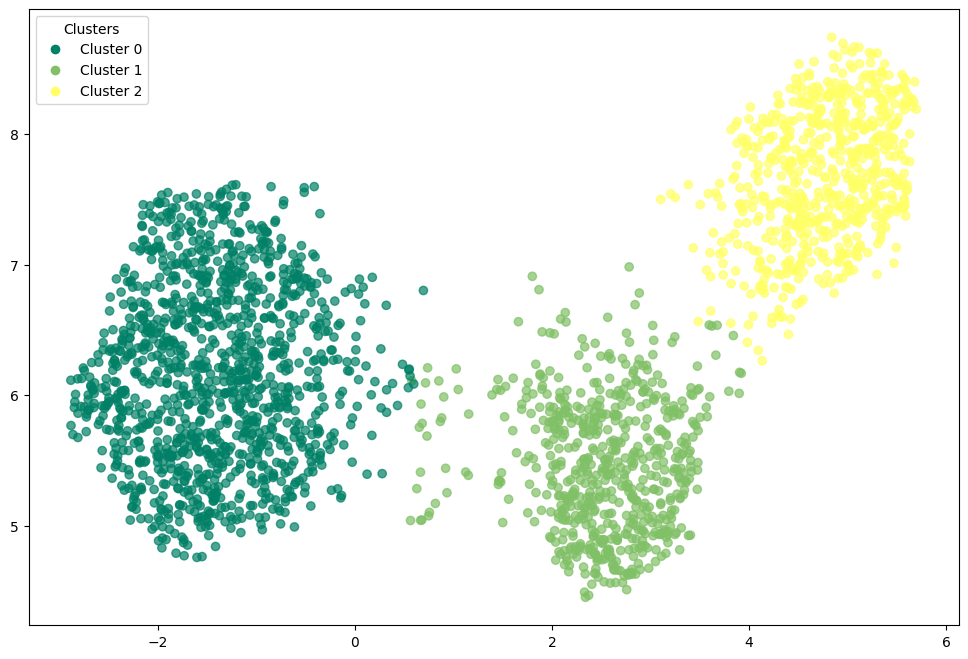

In [699]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['birch_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_birch['birch_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [700]:
print(confusion_matrix(df_umap_birch['target'],df_umap_birch['birch_umap']))

[[1210   33    7]
 [  11  587   27]
 [   2   13  610]]


In [701]:
print(classification_report(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1250
           1       0.93      0.94      0.93       625
           2       0.95      0.98      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.96      2500
weighted avg       0.96      0.96      0.96      2500



In [702]:
adjusted_rand_score(df_umap_birch['target'],df_umap_birch['birch_umap'])

0.9009976916459244

In [703]:
normalized_mutual_info_score(df_umap_birch['target'],df_umap_birch['birch_umap'])

0.8354183145587576

In [704]:
silhouette_score(df_umap_birch.drop(columns=['target','birch_umap']).values,df_umap_birch['birch_umap'])

0.6323453187942505

## GMM, Gaussian Mixture Models - DISTRIBUTION BASED CLUSTERING ALGORITHM TYPE

**Gaussian Mixture Models (GMM)** take a **probabilistic approach** to clustering.  
They assume the data is generated by a mixture of several Gaussian distributions, each defined by its mean, covariance, and weight.

1. **Expectation (E-step):** Compute the probability that each point belongs to each Gaussian component.  
2. **Maximization (M-step):** Update parameters (means, covariances, weights) based on these probabilities.  
3. Repeat until the likelihood converges.

Unlike K-Means, GMM performs **soft clustering** — each point has a probability of belonging to multiple clusters.  
This allows for **elliptical** clusters of different sizes and orientations.

**Strengths**
- Flexible: handles elliptical clusters  
- Provides probabilistic cluster memberships  
- Can model varying cluster sizes  

**Weaknesses**
- Sensitive to initialization  
- Computationally heavier than K-Means  
- Requires choosing number of components 

In [705]:
gmm = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [706]:
gmm.fit(X_values)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [707]:
df_gmm = X_values.copy()

In [708]:
df_gmm['gmm'] = gmm.predict(X_values)

In [709]:
df_gmm['target'] = corr_dataset['target']

In [710]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,gmm,target
0,-2.430304,0.086882,1.500643,-1.101695,-1.149862,-0.669145,-2.157369,0.143811,-0.031344,-0.067369,-1.041196,0.986822,0.950265,-2.246670,0.541926,2,0
1,-0.037234,0.815838,0.765276,-0.519984,-0.229519,0.385842,-0.359125,1.350604,-0.064128,0.791128,-0.098647,0.261653,-0.275983,-0.746390,-0.756312,2,0
2,0.254433,-0.360096,-1.079004,1.483298,1.562848,1.229125,-0.540341,-1.636917,-1.145909,0.795683,1.471501,-0.099578,-0.634620,0.613660,1.693227,0,2
3,-0.495910,-0.191873,-0.676988,0.258118,0.053119,-1.591813,-1.715060,0.983962,0.898351,-0.161179,0.974333,-0.822846,0.195628,-0.984657,1.630914,2,0
4,-1.036493,1.702957,0.153528,-1.791642,-0.981390,-0.379442,1.952336,0.669836,-0.167064,0.873866,-1.117318,-0.060956,0.512524,-1.424860,0.133361,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.850095,0.370775,-0.139374,0.237927,0.352670,1.059525,0.520211,-0.529605,0.675935,-1.095665,0.128876,-0.030411,-1.645437,0.515100,0.240358,0,2
2496,-0.478359,0.810626,-1.073814,-1.887584,-0.156827,-0.730442,0.522611,0.528311,-0.738448,0.822010,0.322361,-0.612541,-1.740065,0.177318,-0.662736,1,1
2497,0.929450,-0.818467,0.460400,1.798746,0.367702,1.231054,-0.320888,0.380040,0.322333,-0.175757,0.510221,0.410040,-1.427009,0.422833,0.593489,0,2
2498,-0.264396,-1.499895,-0.340350,0.169937,0.563522,-0.918608,-0.819506,-1.407699,1.315916,-0.347464,1.524940,-1.135228,0.623112,-0.311318,-0.313947,1,1


In [711]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.2344
accuracy after: 0.9672


In [712]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,gmm,target
0,-2.430304,0.086882,1.500643,-1.101695,-1.149862,-0.669145,-2.157369,0.143811,-0.031344,-0.067369,-1.041196,0.986822,0.950265,-2.246670,0.541926,0,0
1,-0.037234,0.815838,0.765276,-0.519984,-0.229519,0.385842,-0.359125,1.350604,-0.064128,0.791128,-0.098647,0.261653,-0.275983,-0.746390,-0.756312,0,0
2,0.254433,-0.360096,-1.079004,1.483298,1.562848,1.229125,-0.540341,-1.636917,-1.145909,0.795683,1.471501,-0.099578,-0.634620,0.613660,1.693227,2,2
3,-0.495910,-0.191873,-0.676988,0.258118,0.053119,-1.591813,-1.715060,0.983962,0.898351,-0.161179,0.974333,-0.822846,0.195628,-0.984657,1.630914,0,0
4,-1.036493,1.702957,0.153528,-1.791642,-0.981390,-0.379442,1.952336,0.669836,-0.167064,0.873866,-1.117318,-0.060956,0.512524,-1.424860,0.133361,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.850095,0.370775,-0.139374,0.237927,0.352670,1.059525,0.520211,-0.529605,0.675935,-1.095665,0.128876,-0.030411,-1.645437,0.515100,0.240358,2,2
2496,-0.478359,0.810626,-1.073814,-1.887584,-0.156827,-0.730442,0.522611,0.528311,-0.738448,0.822010,0.322361,-0.612541,-1.740065,0.177318,-0.662736,1,1
2497,0.929450,-0.818467,0.460400,1.798746,0.367702,1.231054,-0.320888,0.380040,0.322333,-0.175757,0.510221,0.410040,-1.427009,0.422833,0.593489,2,2
2498,-0.264396,-1.499895,-0.340350,0.169937,0.563522,-0.918608,-0.819506,-1.407699,1.315916,-0.347464,1.524940,-1.135228,0.623112,-0.311318,-0.313947,1,1


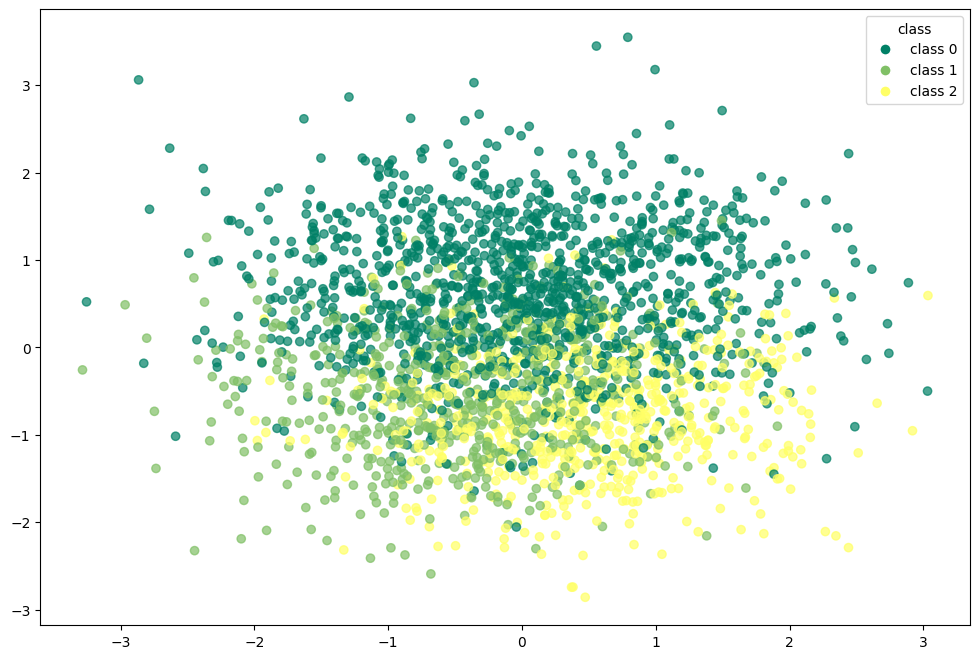

In [713]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

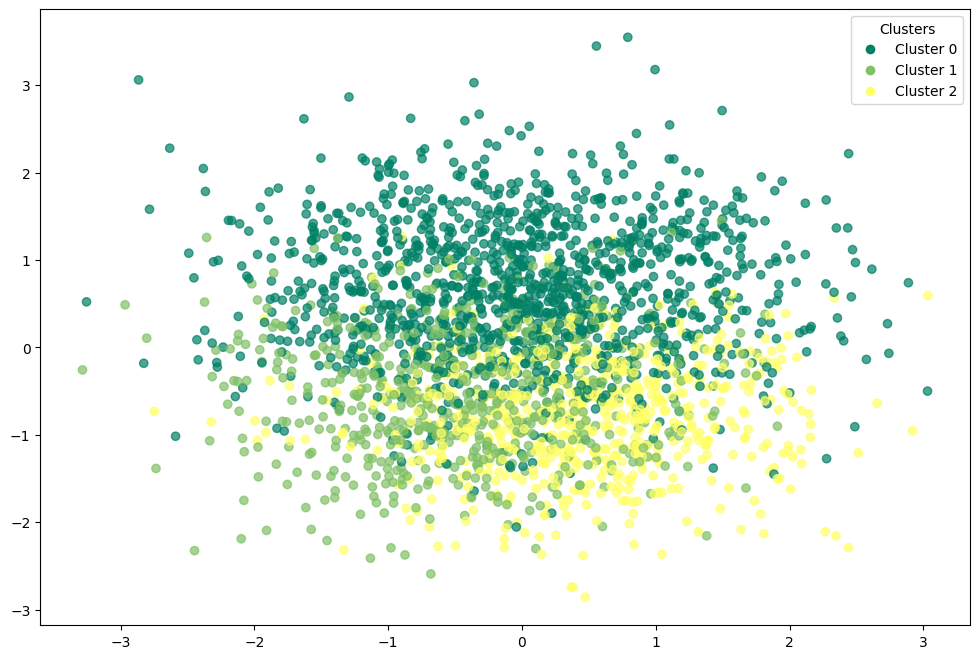

In [714]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [715]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1226   22    2]
 [  18  582   25]
 [   2   13  610]]


In [716]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1250
           1       0.94      0.93      0.94       625
           2       0.96      0.98      0.97       625

    accuracy                           0.97      2500
   macro avg       0.96      0.96      0.96      2500
weighted avg       0.97      0.97      0.97      2500



In [717]:
adjusted_rand_score(df_gmm['target'],df_gmm['gmm'])

0.9139925507816773

In [718]:
normalized_mutual_info_score(df_gmm['target'],df_gmm['gmm'])

0.8513094767621144

In [719]:
silhouette_score(df_gmm.drop(columns=['target','gmm']).values,df_gmm['gmm'])

0.15205111075325745

### GMM with pca

In [720]:
gmm_pca = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [721]:
gmm_pca.fit(X_pca)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [722]:
df_pca_gmm = X_pca.copy()

In [723]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [724]:
df_pca_gmm['target'] = corr_dataset['target']

In [725]:
df_pca_gmm

,dim_1,dim_2,dim_3,gmm_pca,target
0,3.318119,1.307632,-0.583770,2,0
1,1.525994,0.236831,-0.238119,2,0
2,-2.625702,-0.395965,0.551334,0,2
3,0.800585,0.163327,-1.198102,2,0
4,2.365123,0.371408,1.838735,2,0
...,...,...,...,...,...
2495,-1.830113,-1.287129,-0.051732,0,2
2496,-0.039084,1.062949,0.403339,1,1
2497,-1.460975,-1.279639,-0.186106,0,2
2498,-1.241288,1.125036,-1.911574,1,1


In [726]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.2408
accuracy after: 0.9624


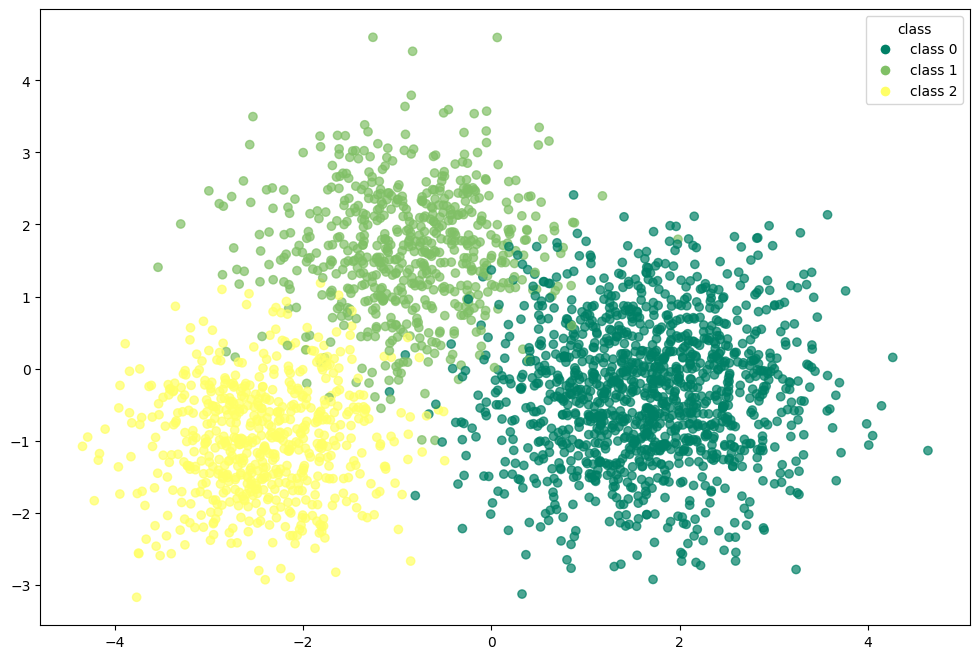

In [727]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

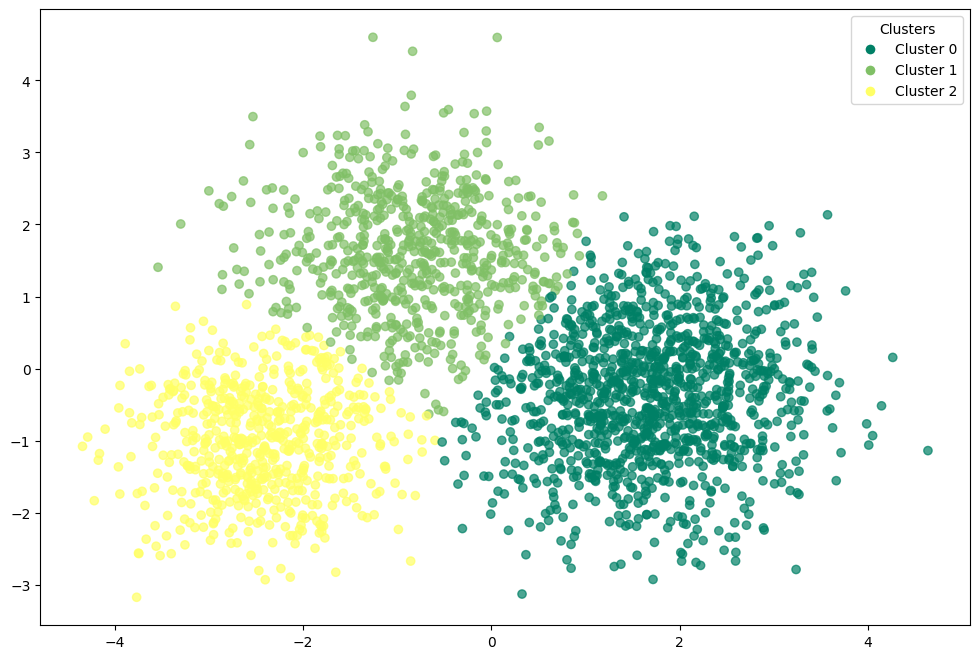

In [728]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [729]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1205   43    2]
 [   7  599   19]
 [   1   22  602]]


In [730]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.99      0.96      0.98      1250
           1       0.90      0.96      0.93       625
           2       0.97      0.96      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.96      2500
weighted avg       0.96      0.96      0.96      2500



In [731]:
adjusted_rand_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.8998283403700694

In [732]:
normalized_mutual_info_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.8407246364006737

In [733]:
silhouette_score(df_pca_gmm.drop(columns=['target','gmm_pca']).values,df_pca_gmm['gmm_pca'])

0.4201955931605067

### GMM with t-SNE

In [734]:
gmm_tsne = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [735]:
gmm_tsne.fit(X_tsne)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [736]:
df_tsne_gmm = X_tsne.copy()

In [737]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [738]:
df_tsne_gmm['target'] = corr_dataset['target']

In [739]:
df_tsne_gmm

,dim_1,dim_2,gmm_tsne,target
0,27.232327,19.136248,2,0
1,28.245445,-3.569001,1,0
2,-44.882462,-14.700111,0,2
3,34.280273,-13.941455,1,0
4,17.900047,2.124485,2,0
...,...,...,...,...
2495,-50.065445,8.796386,0,2
2496,-2.117289,-8.720896,2,1
2497,-42.465763,-2.226987,0,2
2498,-14.853291,1.170913,0,1


In [740]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.0076
accuracy after: 0.548


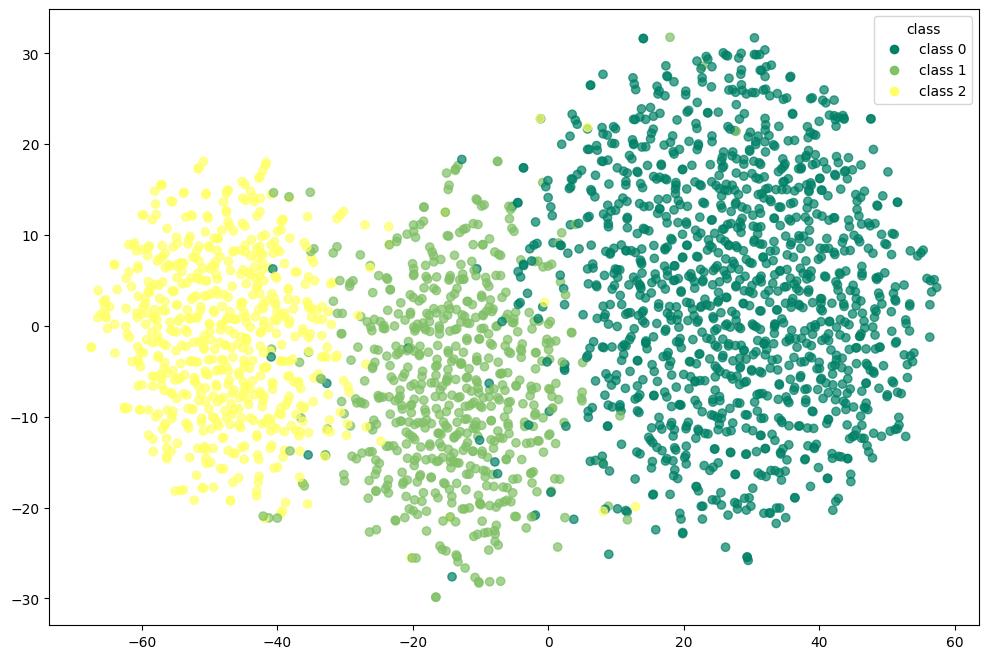

In [741]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

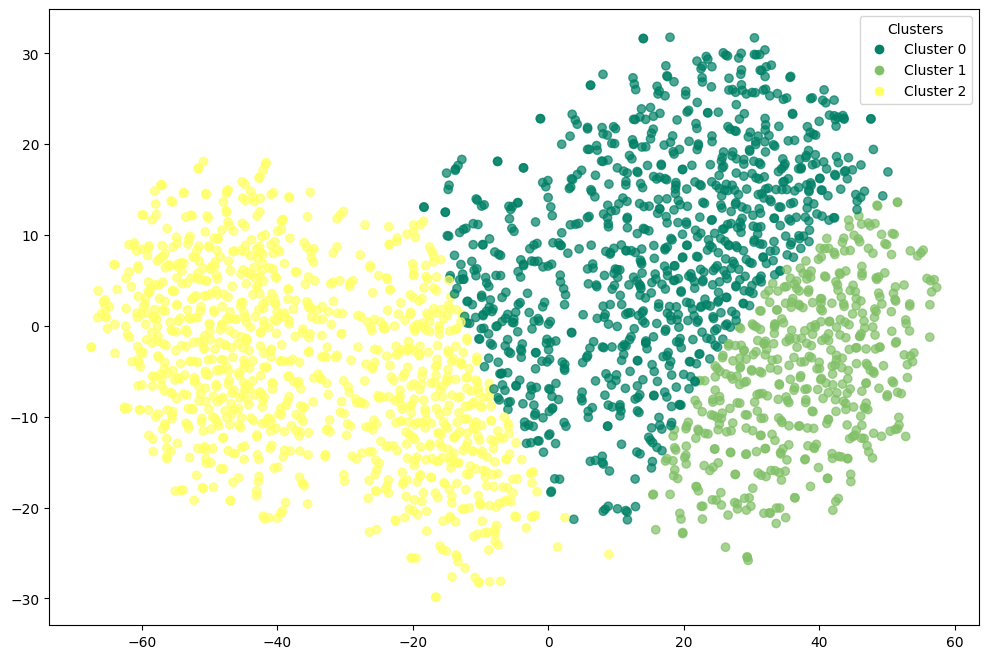

In [742]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [743]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[751 486  13]
 [185   0 440]
 [  6   0 619]]


In [744]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.80      0.60      0.69      1250
           1       0.00      0.00      0.00       625
           2       0.58      0.99      0.73       625

    accuracy                           0.55      2500
   macro avg       0.46      0.53      0.47      2500
weighted avg       0.54      0.55      0.52      2500



In [745]:
adjusted_rand_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.3835907453931476

In [746]:
normalized_mutual_info_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.5011245770507932

In [747]:
silhouette_score(df_tsne_gmm.drop(columns=['target','gmm_tsne']).values,df_tsne_gmm['gmm_tsne'])

0.3804554343223572

### GMM with umap

In [748]:
gmm_umap = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [749]:
gmm_umap.fit(X_umap)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [750]:
df_umap_gmm = X_umap.copy()

In [751]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [752]:
df_umap_gmm['target'] = corr_dataset['target']

In [753]:
df_umap_gmm

,dim_1,dim_2,dim_3,gmm_umap,target
0,-1.696692,5.271500,6.727437,1,0
1,-1.369872,5.945000,5.528481,1,0
2,4.343482,7.803823,5.311739,0,2
3,-0.649922,6.480950,6.926208,1,0
4,-1.606864,6.575488,5.429632,1,0
...,...,...,...,...,...
2495,4.591097,8.220700,4.815832,0,2
2496,2.187583,5.350585,6.522120,2,1
2497,4.363436,7.914960,4.392569,0,2
2498,2.036628,4.874263,5.369936,2,1


In [754]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.016
accuracy after: 0.9604


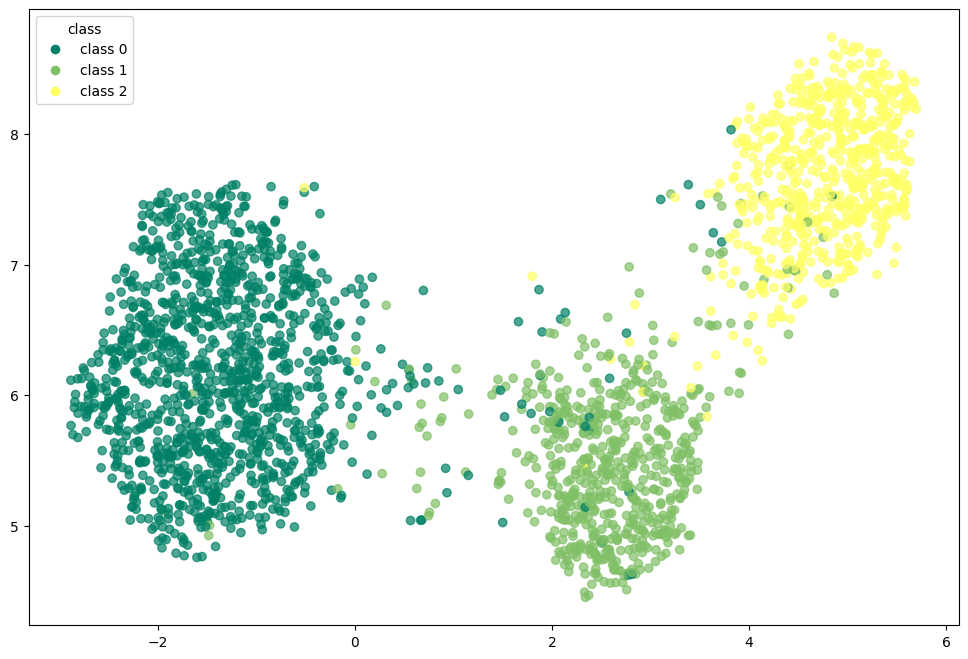

In [755]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

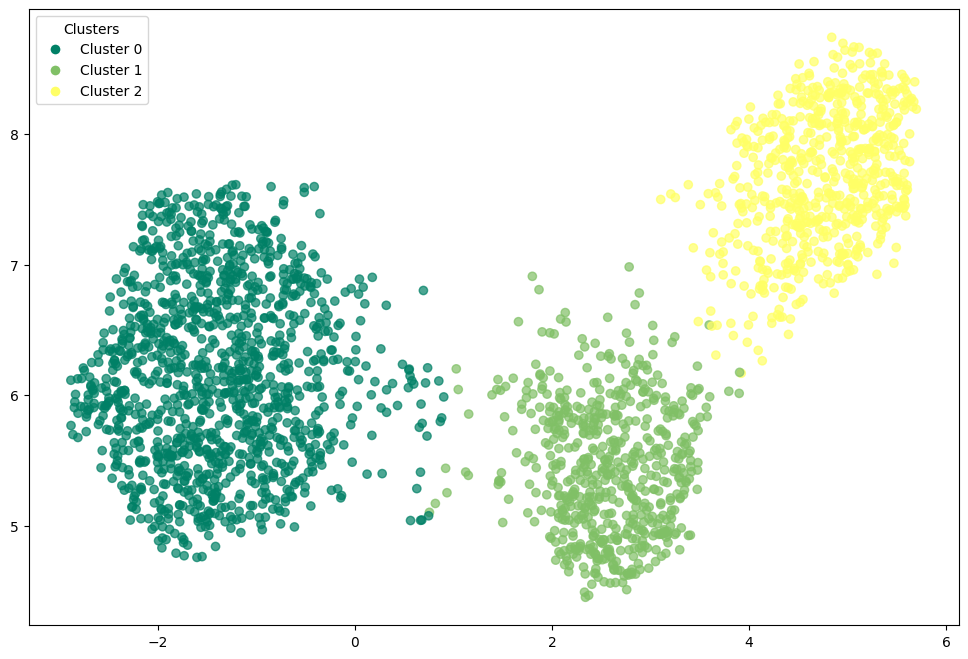

In [756]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [757]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1216   27    7]
 [  22  573   30]
 [   2   11  612]]


In [758]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      1250
           1       0.94      0.92      0.93       625
           2       0.94      0.98      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.95      2500
weighted avg       0.96      0.96      0.96      2500



In [759]:
adjusted_rand_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.8946123460239908

In [760]:
normalized_mutual_info_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.8257306767938076

In [761]:
silhouette_score(df_umap_gmm.drop(columns=['target','gmm_umap']).values,df_umap_gmm['gmm_umap'])

0.6315716505050659

## pam - MEDOIDS BASED CLUSTERING ALGORITHM TYPE

**PAM** is similar to K-Means but uses **medoids** (actual data points) instead of centroids.  
It minimizes the sum of dissimilarities between points and their cluster medoid.

1. **BUILD phase:** Select initial `k` medoids.  
2. **SWAP phase:** Iteratively swap medoids with non-medoids if it reduces the total clustering cost.  
3. Stop when no further improvement is possible.

PAM is more robust to **outliers** since medoids are real observations and not averages.

**Strengths**
- Robust to outliers  
- Works with any distance metric  
- Hard clustering, interpretable medoids  

**Weaknesses**
- Computationally expensive (slow on large data)  
- Not ideal for high-dimensional datasets  
- Still requires `k` to be predefined  

In [762]:
initial_medoids = np.random.choice(len(X_values),N_CLUSTER,replace=False)

In [763]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [764]:
pam = kmedoids(X_values.values.tolist(),initial_medoids,metric=metric)

In [765]:
pam.process()

In [766]:
clusters = pam.get_clusters()

In [767]:
medoids = pam.get_medoids()

In [768]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [769]:
df_pam = corr_dataset.copy()

In [770]:
df_pam['pam'] = labels

In [771]:
df_pam['target'] = corr_dataset['target']

In [772]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,pam
0,-23.864392,2.690029,15.060294,-7.000483,-14.063358,-8.016508,-25.296878,2.273068,0.662419,0.872892,-16.292528,13.737703,11.069429,-22.630377,-2.400037,0,2.0
1,-2.876550,10.531459,7.795377,-1.763142,-4.564244,2.654477,-10.136116,15.038987,0.386425,8.192777,-6.402126,6.036569,-1.930983,-7.864551,-12.981136,0,2.0
2,-0.318551,-2.118141,-10.424846,16.273076,13.935281,11.184125,-11.663924,-16.564171,-8.720446,8.231620,10.073829,2.200373,-5.733167,5.521119,6.983468,2,0.0
3,-6.899252,-0.308559,-6.453203,5.242369,-1.647055,-17.349127,-21.567831,11.160515,8.488972,0.073027,4.856925,-5.480571,3.068935,-10.209591,6.475596,0,1.0
4,-11.640307,20.074266,1.751727,-13.212308,-12.324509,-5.086217,9.351505,7.837564,-0.480129,8.898242,-17.091290,2.610527,6.428599,-14.542085,-5.729987,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,13.675817,5.743887,-1.141950,5.060578,1.444696,9.468652,-2.722552,-4.850593,6.616581,-7.894769,-4.014673,2.934915,-16.449634,4.551085,-4.857921,2,0.0
2496,-6.745331,10.475400,-10.373572,-14.076106,-3.813972,-8.636516,-2.702319,6.340458,-5.290278,8.456096,-1.984385,-3.247177,-17.452862,1.226620,-12.218455,1,1.0
2497,5.601522,-7.048881,4.783405,19.113155,1.599841,11.203639,-9.813747,4.771988,3.639812,-0.051268,-0.013120,7.612407,-14.133906,3.642985,-1.979780,2,0.0
2498,-4.868813,-14.379053,-3.127453,4.448444,3.620953,-10.539785,-14.017526,-14.139415,12.004204,-1.515314,10.634579,-8.798002,7.601031,-3.582555,-9.375704,1,1.0


In [773]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.2152
accuracy after: 0.8192


In [774]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,pam
0,-23.864392,2.690029,15.060294,-7.000483,-14.063358,-8.016508,-25.296878,2.273068,0.662419,0.872892,-16.292528,13.737703,11.069429,-22.630377,-2.400037,0,0
1,-2.876550,10.531459,7.795377,-1.763142,-4.564244,2.654477,-10.136116,15.038987,0.386425,8.192777,-6.402126,6.036569,-1.930983,-7.864551,-12.981136,0,0
2,-0.318551,-2.118141,-10.424846,16.273076,13.935281,11.184125,-11.663924,-16.564171,-8.720446,8.231620,10.073829,2.200373,-5.733167,5.521119,6.983468,2,2
3,-6.899252,-0.308559,-6.453203,5.242369,-1.647055,-17.349127,-21.567831,11.160515,8.488972,0.073027,4.856925,-5.480571,3.068935,-10.209591,6.475596,0,1
4,-11.640307,20.074266,1.751727,-13.212308,-12.324509,-5.086217,9.351505,7.837564,-0.480129,8.898242,-17.091290,2.610527,6.428599,-14.542085,-5.729987,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,13.675817,5.743887,-1.141950,5.060578,1.444696,9.468652,-2.722552,-4.850593,6.616581,-7.894769,-4.014673,2.934915,-16.449634,4.551085,-4.857921,2,2
2496,-6.745331,10.475400,-10.373572,-14.076106,-3.813972,-8.636516,-2.702319,6.340458,-5.290278,8.456096,-1.984385,-3.247177,-17.452862,1.226620,-12.218455,1,1
2497,5.601522,-7.048881,4.783405,19.113155,1.599841,11.203639,-9.813747,4.771988,3.639812,-0.051268,-0.013120,7.612407,-14.133906,3.642985,-1.979780,2,2
2498,-4.868813,-14.379053,-3.127453,4.448444,3.620953,-10.539785,-14.017526,-14.139415,12.004204,-1.515314,10.634579,-8.798002,7.601031,-3.582555,-9.375704,1,1


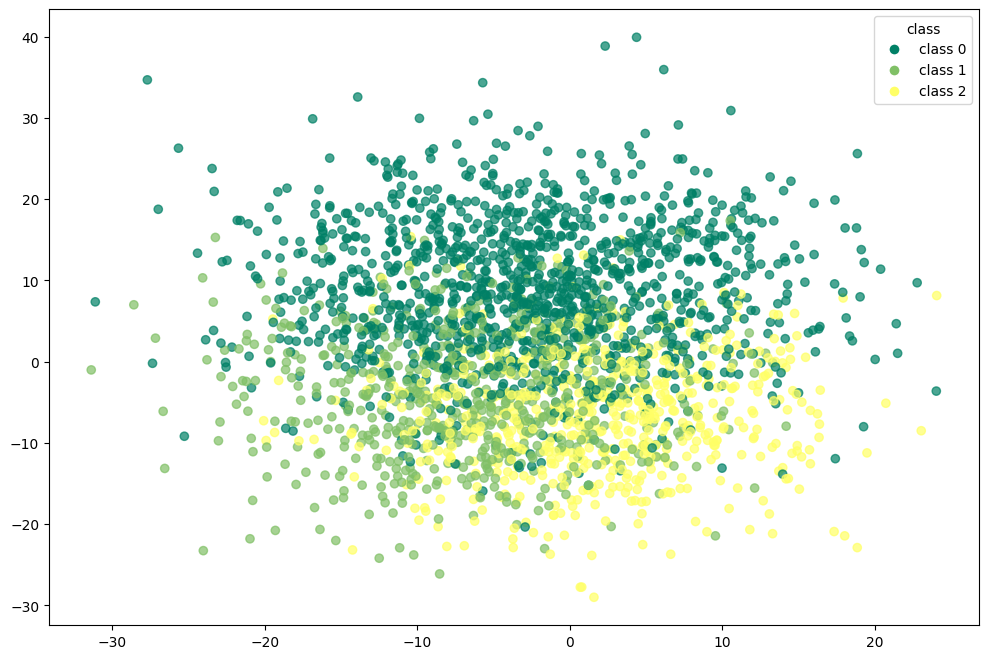

In [775]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

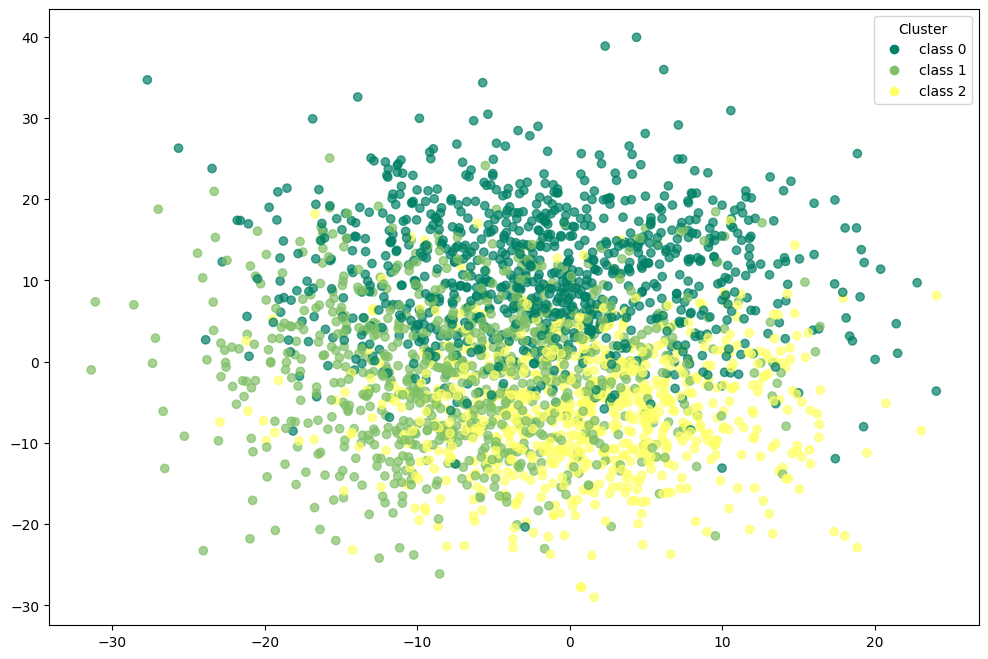

In [776]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [777]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[913 313  24]
 [  1 514 110]
 [  0   4 621]]


In [778]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       1.00      0.73      0.84      1250
           1       0.62      0.82      0.71       625
           2       0.82      0.99      0.90       625

    accuracy                           0.82      2500
   macro avg       0.81      0.85      0.82      2500
weighted avg       0.86      0.82      0.82      2500



In [779]:
adjusted_rand_score(df_pam['target'],df_pam['pam'])

0.5632445389499833

In [780]:
normalized_mutual_info_score(df_pam['target'],df_pam['pam'])

0.6000475387251267

In [781]:
silhouette_score(df_pam.drop(columns=['target','pam']).values,df_pam['pam'])

0.13490727999076235

### pam with pca

In [782]:
initial_medoids = np.random.choice(len(X_pca),N_CLUSTER,replace=False)

In [783]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [784]:
pam_pca = kmedoids(X_pca.values.tolist(),initial_medoids,metric=metric)

In [785]:
pam_pca.process()

In [786]:
clusters = pam_pca.get_clusters()

In [787]:
medoids = pam_pca.get_medoids()

In [788]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [789]:
df_pam_pca = X_pca.copy()

In [790]:
df_pam_pca['pam_pca'] = labels

In [791]:
df_pam_pca['target'] = corr_dataset['target']

In [792]:
df_pam_pca

,dim_1,dim_2,dim_3,pam_pca,target
0,3.318119,1.307632,-0.583770,0.0,0
1,1.525994,0.236831,-0.238119,0.0,0
2,-2.625702,-0.395965,0.551334,1.0,2
3,0.800585,0.163327,-1.198102,0.0,0
4,2.365123,0.371408,1.838735,0.0,0
...,...,...,...,...,...
2495,-1.830113,-1.287129,-0.051732,1.0,2
2496,-0.039084,1.062949,0.403339,2.0,1
2497,-1.460975,-1.279639,-0.186106,1.0,2
2498,-1.241288,1.125036,-1.911574,2.0,1


In [793]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.4916
accuracy after: 0.9572


In [794]:
df_pam_pca

,dim_1,dim_2,dim_3,pam_pca,target
0,3.318119,1.307632,-0.583770,0,0
1,1.525994,0.236831,-0.238119,0,0
2,-2.625702,-0.395965,0.551334,2,2
3,0.800585,0.163327,-1.198102,0,0
4,2.365123,0.371408,1.838735,0,0
...,...,...,...,...,...
2495,-1.830113,-1.287129,-0.051732,2,2
2496,-0.039084,1.062949,0.403339,1,1
2497,-1.460975,-1.279639,-0.186106,2,2
2498,-1.241288,1.125036,-1.911574,1,1


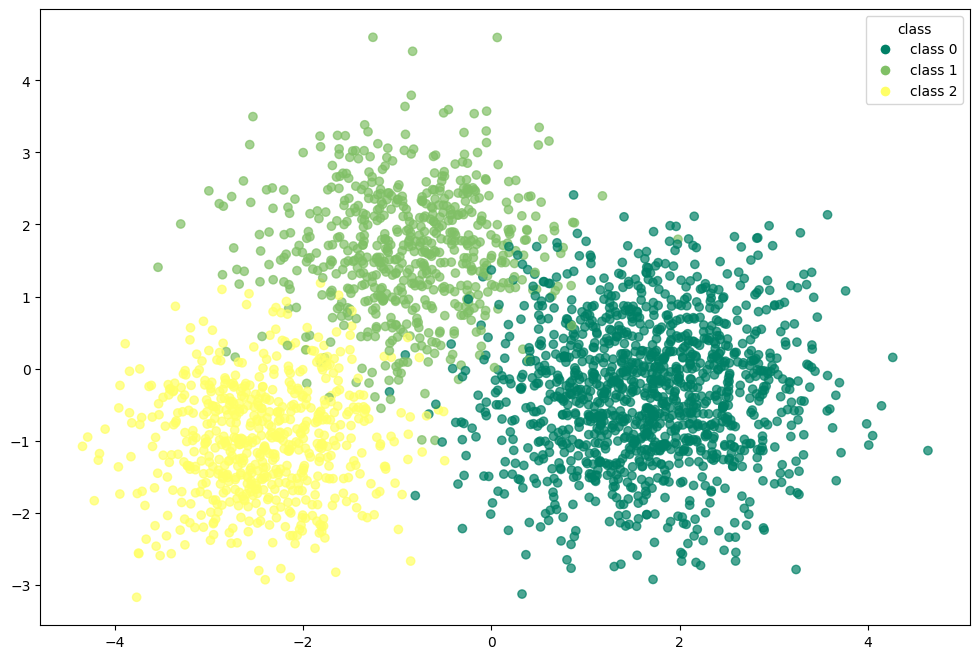

In [795]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

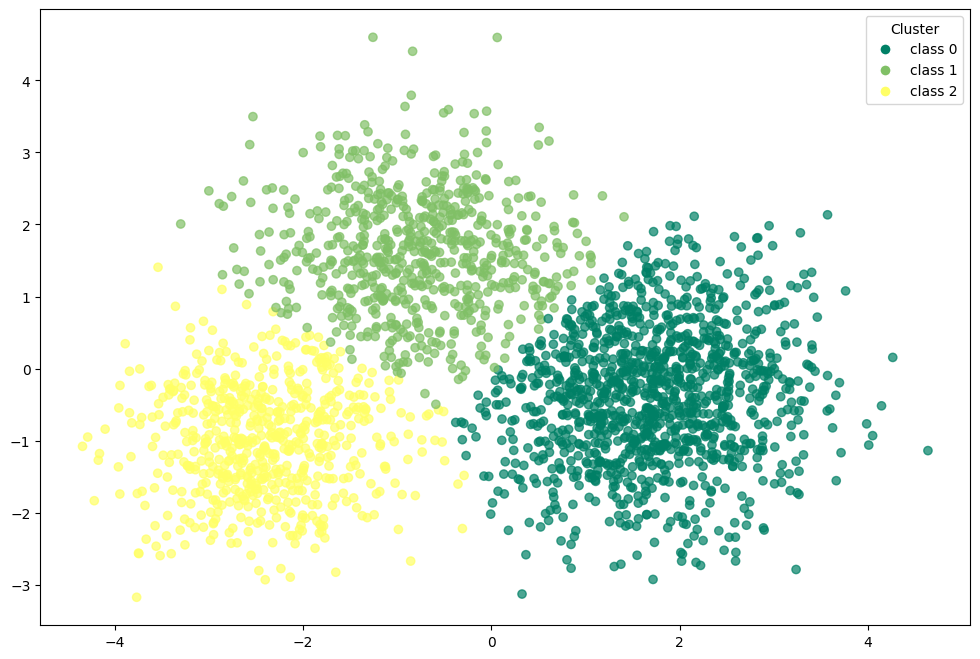

In [796]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [797]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1188   55    7]
 [   4  598   23]
 [   0   18  607]]


In [798]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97      1250
           1       0.89      0.96      0.92       625
           2       0.95      0.97      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.95      2500
weighted avg       0.96      0.96      0.96      2500



In [799]:
adjusted_rand_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.8839071833487668

In [800]:
normalized_mutual_info_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.8265169389582088

In [801]:
silhouette_score(df_pam_pca.drop(columns=['target','pam_pca']).values,df_pam_pca['pam_pca'])

0.4203818419035493

### pam with t-SNE

In [802]:
initial_medoids = np.random.choice(len(X_tsne),N_CLUSTER,replace=False)

In [803]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [804]:
pam_tsne = kmedoids(X_tsne.values.tolist(),initial_medoids,metric=metric)

In [805]:
pam_tsne.process()

In [806]:
clusters = pam_tsne.get_clusters()

In [807]:
medoids = pam_tsne.get_medoids()

In [808]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [809]:
df_pam_tsne = X_tsne.copy()

In [810]:
df_pam_tsne['pam_tsne'] = labels

In [811]:
df_pam_tsne['target'] = corr_dataset['target']

In [812]:
df_pam_tsne

,dim_1,dim_2,pam_tsne,target
0,27.232327,19.136248,2.0,0
1,28.245445,-3.569001,2.0,0
2,-44.882462,-14.700111,0.0,2
3,34.280273,-13.941455,2.0,0
4,17.900047,2.124485,2.0,0
...,...,...,...,...
2495,-50.065445,8.796386,0.0,2
2496,-2.117289,-8.720896,1.0,1
2497,-42.465763,-2.226987,0.0,2
2498,-14.853291,1.170913,1.0,1


In [813]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.2388
accuracy after: 0.9328


In [814]:
df_pam_tsne

,dim_1,dim_2,pam_tsne,target
0,27.232327,19.136248,0,0
1,28.245445,-3.569001,0,0
2,-44.882462,-14.700111,2,2
3,34.280273,-13.941455,0,0
4,17.900047,2.124485,0,0
...,...,...,...,...
2495,-50.065445,8.796386,2,2
2496,-2.117289,-8.720896,1,1
2497,-42.465763,-2.226987,2,2
2498,-14.853291,1.170913,1,1


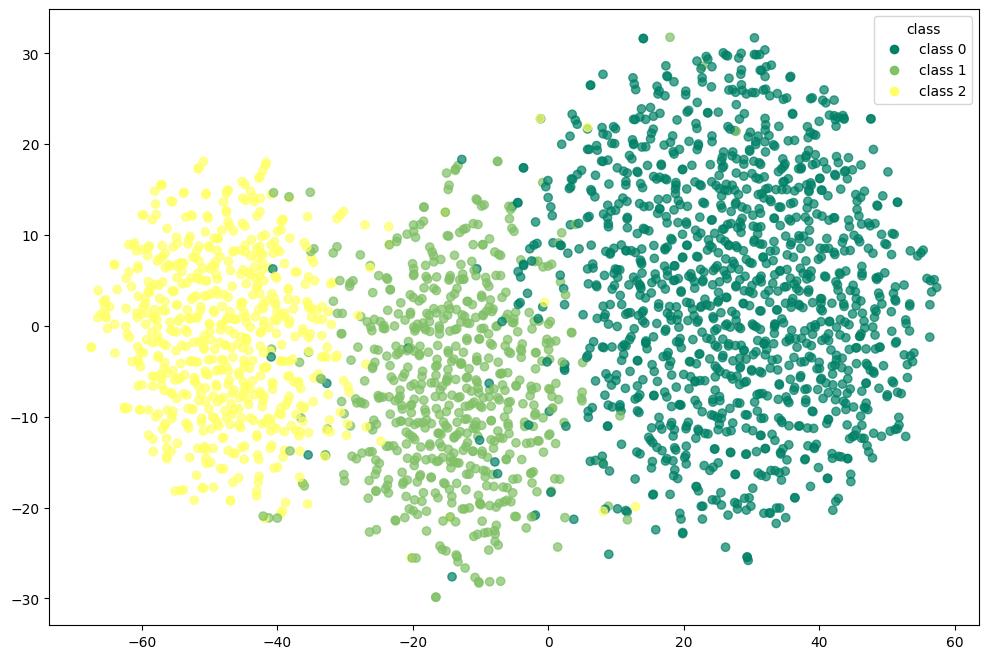

In [815]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

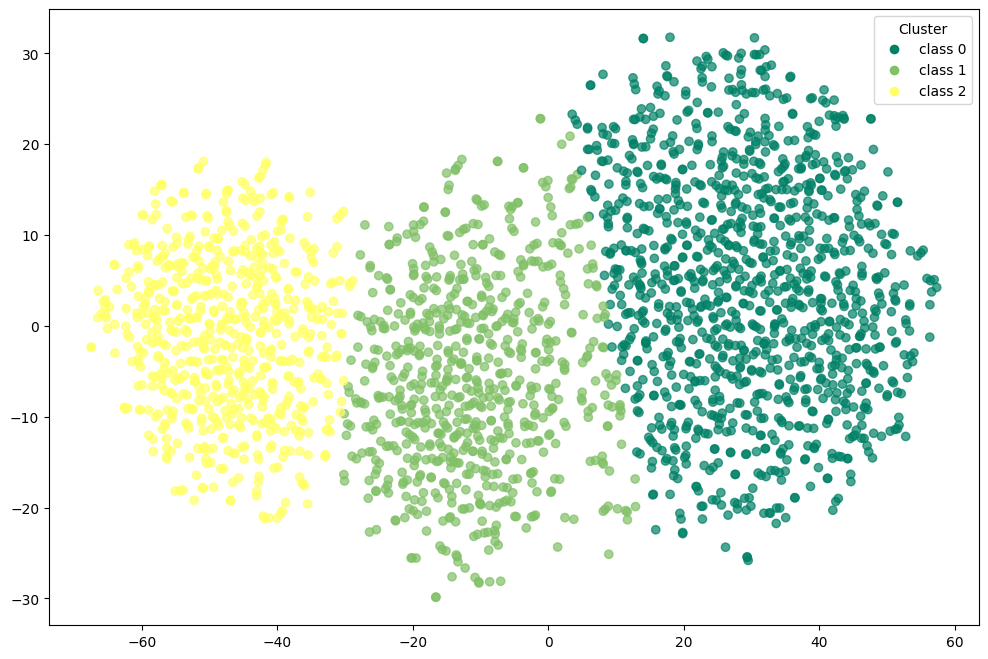

In [816]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [817]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1136  109    5]
 [   3  591   31]
 [   1   19  605]]


In [818]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.91      0.95      1250
           1       0.82      0.95      0.88       625
           2       0.94      0.97      0.96       625

    accuracy                           0.93      2500
   macro avg       0.92      0.94      0.93      2500
weighted avg       0.94      0.93      0.93      2500



In [819]:
adjusted_rand_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.8160793861520611

In [820]:
normalized_mutual_info_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.7702128015589632

In [821]:
silhouette_score(df_pam_tsne.drop(columns=['target','pam_tsne']).values,df_pam_tsne['pam_tsne'])

0.49693793058395386

### pam with umap

In [822]:
initial_medoids = np.random.choice(len(X_umap),N_CLUSTER,replace=False)

In [823]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [824]:
pam_umap = kmedoids(X_umap.values.tolist(),initial_medoids,metric=metric)

In [825]:
pam_umap.process()

In [826]:
clusters = pam_umap.get_clusters()

In [827]:
medoids = pam_umap.get_medoids()

In [828]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [829]:
df_pam_umap = X_umap.copy()

In [830]:
df_pam_umap['pam_umap'] = labels

In [831]:
df_pam_umap['target'] = corr_dataset['target']

In [832]:
df_pam_umap

,dim_1,dim_2,dim_3,pam_umap,target
0,-1.696692,5.271500,6.727437,2.0,0
1,-1.369872,5.945000,5.528481,2.0,0
2,4.343482,7.803823,5.311739,1.0,2
3,-0.649922,6.480950,6.926208,2.0,0
4,-1.606864,6.575488,5.429632,2.0,0
...,...,...,...,...,...
2495,4.591097,8.220700,4.815832,1.0,2
2496,2.187583,5.350585,6.522120,0.0,1
2497,4.363436,7.914960,4.392569,1.0,2
2498,2.036628,4.874263,5.369936,0.0,1


In [833]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.0248
accuracy after: 0.9624


In [834]:
df_pam_umap

,dim_1,dim_2,dim_3,pam_umap,target
0,-1.696692,5.271500,6.727437,0,0
1,-1.369872,5.945000,5.528481,0,0
2,4.343482,7.803823,5.311739,2,2
3,-0.649922,6.480950,6.926208,0,0
4,-1.606864,6.575488,5.429632,0,0
...,...,...,...,...,...
2495,4.591097,8.220700,4.815832,2,2
2496,2.187583,5.350585,6.522120,1,1
2497,4.363436,7.914960,4.392569,2,2
2498,2.036628,4.874263,5.369936,1,1


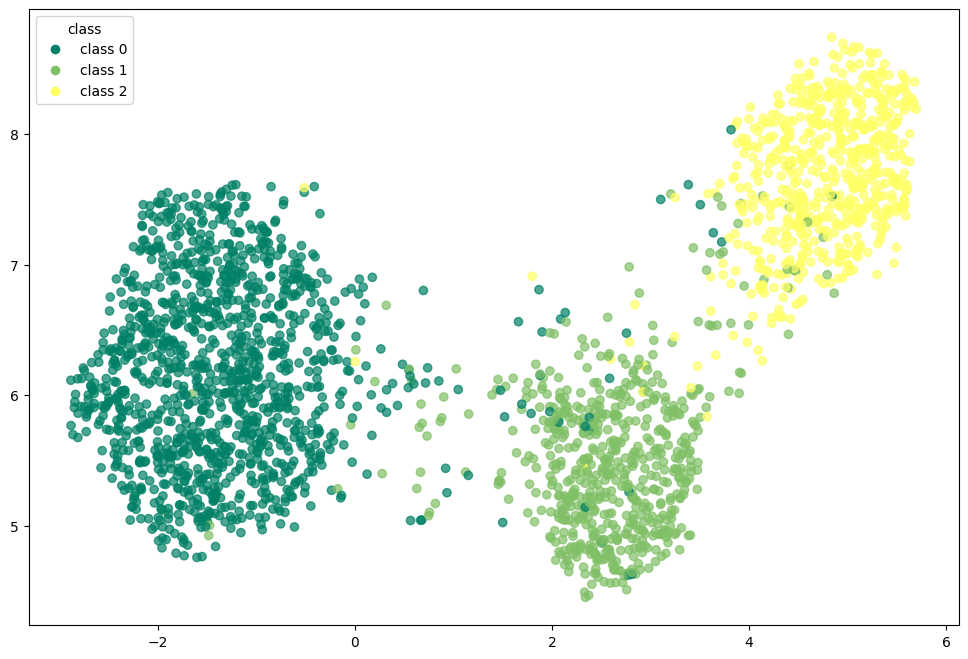

In [835]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

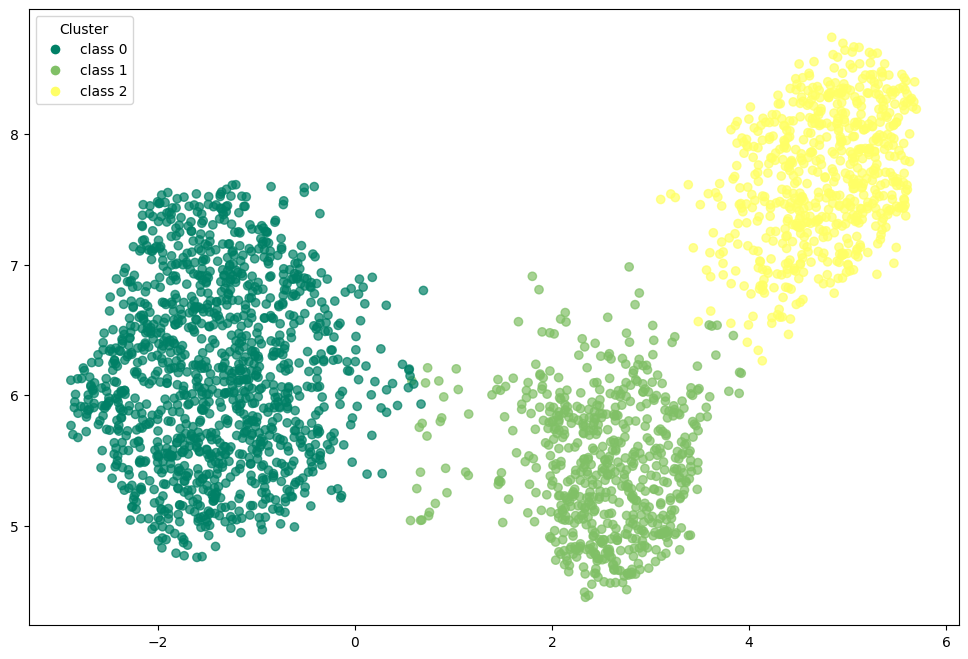

In [836]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [837]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1210   33    7]
 [  12  586   27]
 [   2   13  610]]


In [838]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1250
           1       0.93      0.94      0.93       625
           2       0.95      0.98      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.96      2500
weighted avg       0.96      0.96      0.96      2500



In [839]:
adjusted_rand_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.8998152099157545

In [840]:
normalized_mutual_info_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.8337632887374637

In [841]:
silhouette_score(df_pam_umap.drop(columns=['target','pam_umap']).values,df_pam_umap['pam_umap'])

0.6324371099472046

## spectral clustering - GRAPH BASED CLUSTERING ALGORITHM TYPE

**Spectral Clustering** views clustering as a **graph partitioning** problem.  
It constructs a similarity graph where nodes represent data points and edges encode pairwise similarity.  
Then, it uses **eigen-decomposition** of the graph Laplacian to embed points into a new space, where simple clustering (e.g. K-Means) is applied.

1. **Construct similarity graph:** Define edge weights using a kernel (e.g. Gaussian) or k-nearest neighbors.  
2. **Compute Laplacian matrix:** `L = D - W` (or normalized variants).  
3. **Eigen-decomposition:** Extract the first `k` eigenvectors of `L` to create a low-dimensional embedding.  
4. **Clustering step:** Apply K-Means in the spectral space.

This method can capture **non-linear**, **non-convex** cluster structures that K-Means cannot.

**Strengths**
- Detects clusters of arbitrary shape  
- Works with non-linear separations  
- The graph approach captures local structure  

**Weaknesses**
- Building similarity matrix can be costly  
- Requires tuning of kernel parameters  
- Eigen-decomposition is computationally intensive  

In [842]:
spectral_clustering = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [843]:
spectral_clustering.fit(X_values)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [844]:
df_spectral = X_values.copy()

In [845]:
df_spectral['spectral_clustering'] = spectral_clustering.labels_

In [846]:
df_spectral['target'] = corr_dataset['target']

In [847]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,spectral_clustering,target
0,-2.430304,0.086882,1.500643,-1.101695,-1.149862,-0.669145,-2.157369,0.143811,-0.031344,-0.067369,-1.041196,0.986822,0.950265,-2.246670,0.541926,1,0
1,-0.037234,0.815838,0.765276,-0.519984,-0.229519,0.385842,-0.359125,1.350604,-0.064128,0.791128,-0.098647,0.261653,-0.275983,-0.746390,-0.756312,1,0
2,0.254433,-0.360096,-1.079004,1.483298,1.562848,1.229125,-0.540341,-1.636917,-1.145909,0.795683,1.471501,-0.099578,-0.634620,0.613660,1.693227,0,2
3,-0.495910,-0.191873,-0.676988,0.258118,0.053119,-1.591813,-1.715060,0.983962,0.898351,-0.161179,0.974333,-0.822846,0.195628,-0.984657,1.630914,1,0
4,-1.036493,1.702957,0.153528,-1.791642,-0.981390,-0.379442,1.952336,0.669836,-0.167064,0.873866,-1.117318,-0.060956,0.512524,-1.424860,0.133361,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.850095,0.370775,-0.139374,0.237927,0.352670,1.059525,0.520211,-0.529605,0.675935,-1.095665,0.128876,-0.030411,-1.645437,0.515100,0.240358,0,2
2496,-0.478359,0.810626,-1.073814,-1.887584,-0.156827,-0.730442,0.522611,0.528311,-0.738448,0.822010,0.322361,-0.612541,-1.740065,0.177318,-0.662736,2,1
2497,0.929450,-0.818467,0.460400,1.798746,0.367702,1.231054,-0.320888,0.380040,0.322333,-0.175757,0.510221,0.410040,-1.427009,0.422833,0.593489,0,2
2498,-0.264396,-1.499895,-0.340350,0.169937,0.563522,-0.918608,-0.819506,-1.407699,1.315916,-0.347464,1.524940,-1.135228,0.623112,-0.311318,-0.313947,2,1


In [848]:
y_true = df_spectral['target'].values  
y_spectral = df_spectral['spectral_clustering'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_spectral['spectral_clustering'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_spectral['spectral_clustering'] == y_true))

accuracy before: 0.0128
accuracy after: 0.966


In [849]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,spectral_clustering,target
0,-2.430304,0.086882,1.500643,-1.101695,-1.149862,-0.669145,-2.157369,0.143811,-0.031344,-0.067369,-1.041196,0.986822,0.950265,-2.246670,0.541926,0,0
1,-0.037234,0.815838,0.765276,-0.519984,-0.229519,0.385842,-0.359125,1.350604,-0.064128,0.791128,-0.098647,0.261653,-0.275983,-0.746390,-0.756312,0,0
2,0.254433,-0.360096,-1.079004,1.483298,1.562848,1.229125,-0.540341,-1.636917,-1.145909,0.795683,1.471501,-0.099578,-0.634620,0.613660,1.693227,2,2
3,-0.495910,-0.191873,-0.676988,0.258118,0.053119,-1.591813,-1.715060,0.983962,0.898351,-0.161179,0.974333,-0.822846,0.195628,-0.984657,1.630914,0,0
4,-1.036493,1.702957,0.153528,-1.791642,-0.981390,-0.379442,1.952336,0.669836,-0.167064,0.873866,-1.117318,-0.060956,0.512524,-1.424860,0.133361,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.850095,0.370775,-0.139374,0.237927,0.352670,1.059525,0.520211,-0.529605,0.675935,-1.095665,0.128876,-0.030411,-1.645437,0.515100,0.240358,2,2
2496,-0.478359,0.810626,-1.073814,-1.887584,-0.156827,-0.730442,0.522611,0.528311,-0.738448,0.822010,0.322361,-0.612541,-1.740065,0.177318,-0.662736,1,1
2497,0.929450,-0.818467,0.460400,1.798746,0.367702,1.231054,-0.320888,0.380040,0.322333,-0.175757,0.510221,0.410040,-1.427009,0.422833,0.593489,2,2
2498,-0.264396,-1.499895,-0.340350,0.169937,0.563522,-0.918608,-0.819506,-1.407699,1.315916,-0.347464,1.524940,-1.135228,0.623112,-0.311318,-0.313947,1,1


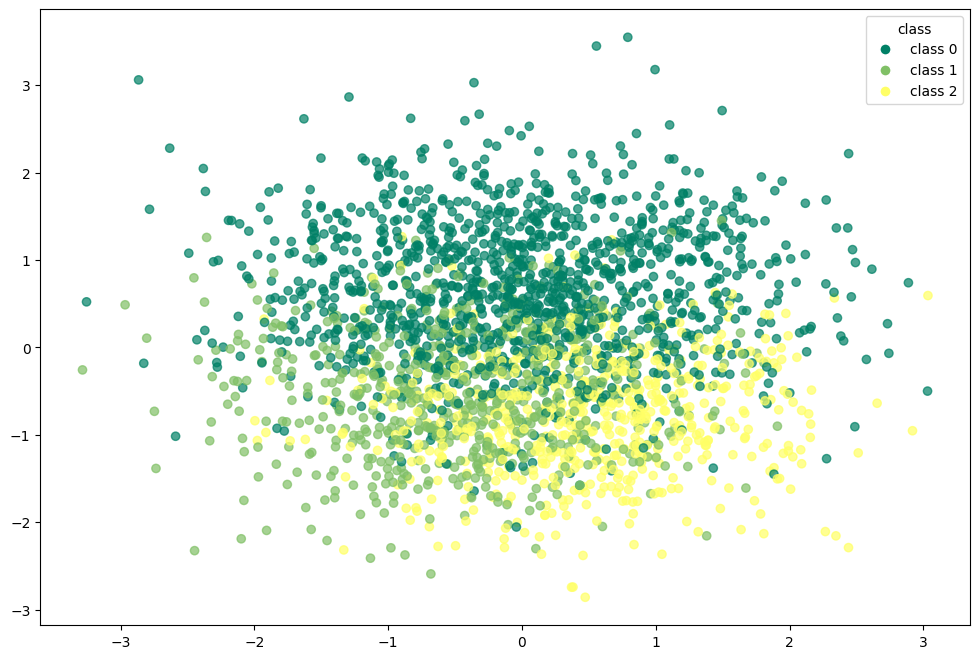

In [850]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0],df_spectral.iloc[:, 1], 
                      c=df_spectral['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_spectral['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

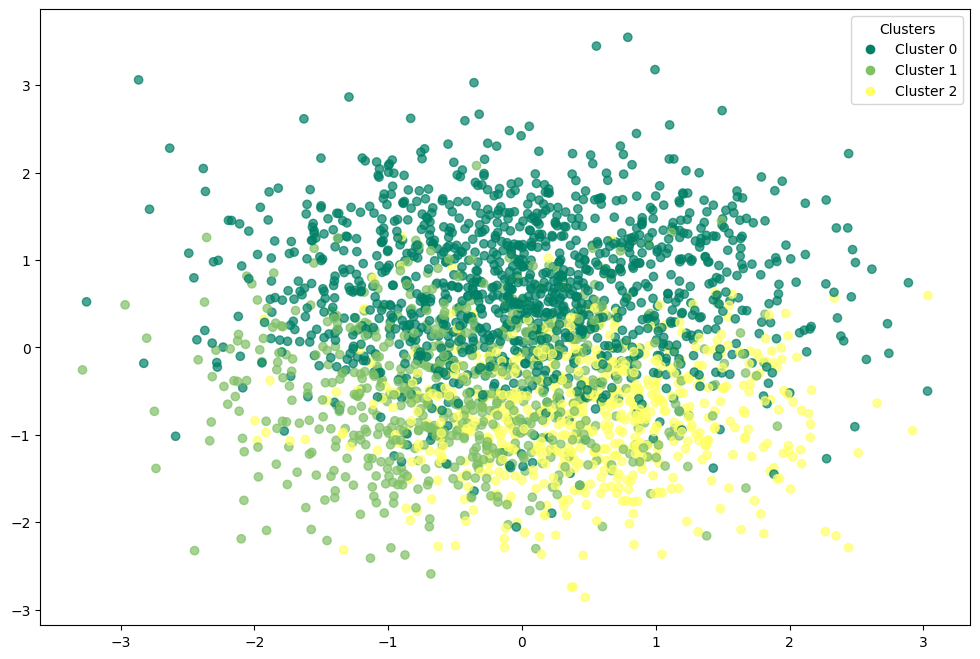

In [851]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0], df_spectral.iloc[:, 1], 
                      c=df_spectral['spectral_clustering'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_spectral['spectral_clustering'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [852]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[1215   31    4]
 [  13  592   20]
 [   2   15  608]]


In [853]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1250
           1       0.93      0.95      0.94       625
           2       0.96      0.97      0.97       625

    accuracy                           0.97      2500
   macro avg       0.96      0.96      0.96      2500
weighted avg       0.97      0.97      0.97      2500



In [854]:
adjusted_rand_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.9086597636531907

In [855]:
normalized_mutual_info_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.8461954201876155

In [856]:
silhouette_score(df_spectral.drop(columns=['target','spectral_clustering']).values,df_spectral['spectral_clustering'])

0.15245735622689527

### spectral clustering with pca

In [857]:
spectral_pca = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [858]:
spectral_pca.fit(X_pca)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [859]:
df_pca_spectral = X_pca.copy()

In [860]:
df_pca_spectral["spectral_pca"] = spectral_pca.labels_

In [861]:
df_pca_spectral['target'] = corr_dataset['target']

In [862]:
df_pca_spectral

,dim_1,dim_2,dim_3,spectral_pca,target
0,3.318119,1.307632,-0.583770,1,0
1,1.525994,0.236831,-0.238119,1,0
2,-2.625702,-0.395965,0.551334,0,2
3,0.800585,0.163327,-1.198102,1,0
4,2.365123,0.371408,1.838735,1,0
...,...,...,...,...,...
2495,-1.830113,-1.287129,-0.051732,0,2
2496,-0.039084,1.062949,0.403339,2,1
2497,-1.460975,-1.279639,-0.186106,0,2
2498,-1.241288,1.125036,-1.911574,2,1


In [863]:
y_true = df_pca_spectral['target'].values  
y_spectral_pca = df_pca_spectral['spectral_pca'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_pca)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_spectral['spectral_pca'] = np.array([mapping[label] for label in y_spectral_pca])

print("accuracy before:", np.mean(y_spectral_pca == y_true))
print("accuracy after:", np.mean(df_pca_spectral['spectral_pca'] == y_true))

accuracy before: 0.0128
accuracy after: 0.9612


In [864]:
df_pca_spectral

,dim_1,dim_2,dim_3,spectral_pca,target
0,3.318119,1.307632,-0.583770,0,0
1,1.525994,0.236831,-0.238119,0,0
2,-2.625702,-0.395965,0.551334,2,2
3,0.800585,0.163327,-1.198102,0,0
4,2.365123,0.371408,1.838735,0,0
...,...,...,...,...,...
2495,-1.830113,-1.287129,-0.051732,2,2
2496,-0.039084,1.062949,0.403339,1,1
2497,-1.460975,-1.279639,-0.186106,2,2
2498,-1.241288,1.125036,-1.911574,1,1


In [865]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[1206   40    4]
 [  10  592   23]
 [   2   18  605]]


In [866]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       0.99      0.96      0.98      1250
           1       0.91      0.95      0.93       625
           2       0.96      0.97      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.96      2500
weighted avg       0.96      0.96      0.96      2500



In [867]:
adjusted_rand_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.8964401604053804

In [868]:
normalized_mutual_info_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.8322962685351485

In [869]:
silhouette_score(df_pca_spectral.drop(columns=['target','spectral_pca']).values,df_pca_spectral['spectral_pca'])

0.421354417782704

### spectral clustering with t-SNE

In [870]:
spectral_tsne = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [871]:
spectral_tsne.fit(X_tsne)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [872]:
df_tsne_spectral = X_tsne.copy()

In [873]:
df_tsne_spectral['spectral_tsne'] = spectral_tsne.labels_

In [874]:
df_tsne_spectral['target'] = corr_dataset['target']

In [875]:
df_tsne_spectral

,dim_1,dim_2,spectral_tsne,target
0,27.232327,19.136248,0,0
1,28.245445,-3.569001,0,0
2,-44.882462,-14.700111,2,2
3,34.280273,-13.941455,0,0
4,17.900047,2.124485,0,0
...,...,...,...,...
2495,-50.065445,8.796386,2,2
2496,-2.117289,-8.720896,1,1
2497,-42.465763,-2.226987,2,2
2498,-14.853291,1.170913,1,1


In [876]:
y_true = df_tsne_spectral['target'].values  
y_spectral_tsne = df_tsne_spectral['spectral_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_tsne)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_spectral['spectral_tsne'] = np.array([mapping[label] for label in y_spectral_tsne])

print("accuracy before:", np.mean(y_spectral_tsne == y_true))
print("accuracy after:", np.mean(df_tsne_spectral['spectral_tsne'] == y_true))

accuracy before: 0.9008
accuracy after: 0.9008


In [877]:
df_tsne_spectral

,dim_1,dim_2,spectral_tsne,target
0,27.232327,19.136248,0,0
1,28.245445,-3.569001,0,0
2,-44.882462,-14.700111,2,2
3,34.280273,-13.941455,0,0
4,17.900047,2.124485,0,0
...,...,...,...,...
2495,-50.065445,8.796386,2,2
2496,-2.117289,-8.720896,1,1
2497,-42.465763,-2.226987,2,2
2498,-14.853291,1.170913,1,1


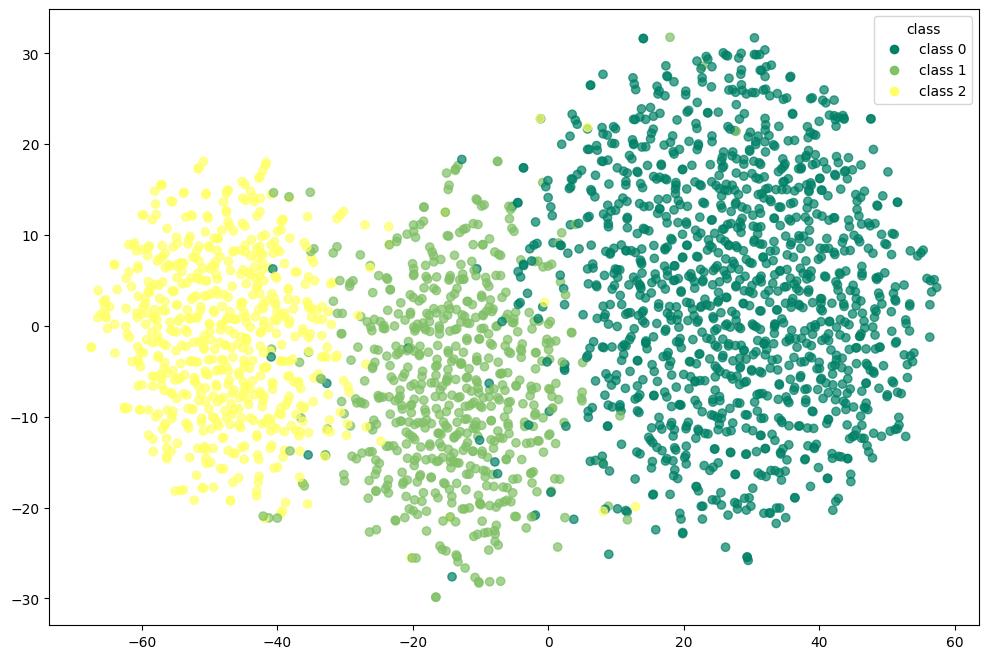

In [878]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

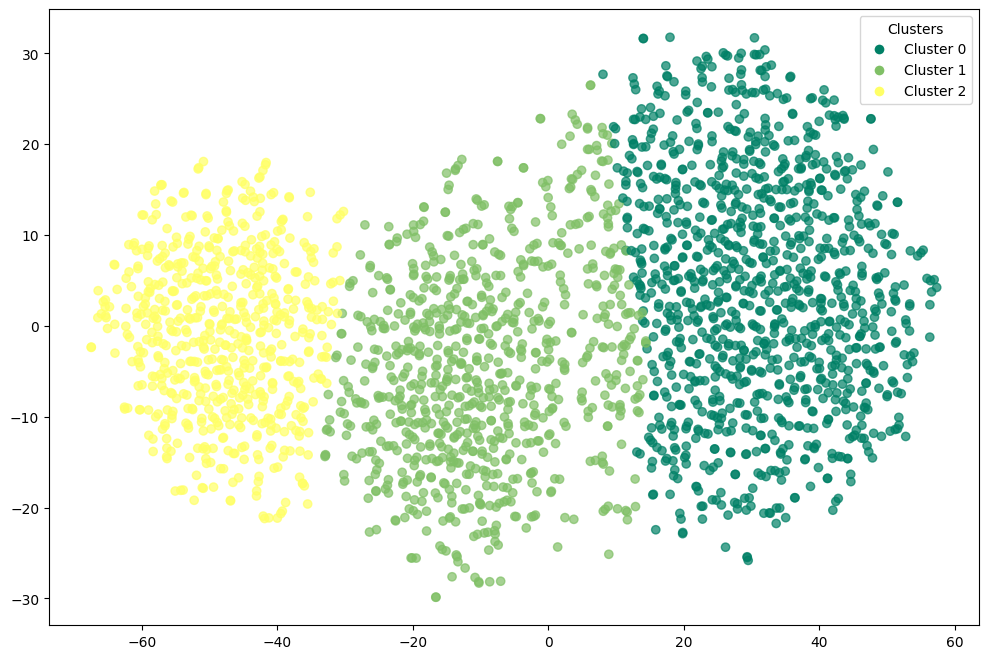

In [879]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['spectral_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_spectral['spectral_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [880]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[1056  190    4]
 [   3  600   22]
 [   0   29  596]]


In [881]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.84      0.91      1250
           1       0.73      0.96      0.83       625
           2       0.96      0.95      0.96       625

    accuracy                           0.90      2500
   macro avg       0.90      0.92      0.90      2500
weighted avg       0.92      0.90      0.90      2500



In [882]:
adjusted_rand_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.727256782976075

In [883]:
normalized_mutual_info_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.7179672630067045

In [884]:
silhouette_score(df_tsne_spectral.drop(columns=['target','spectral_tsne']).values,df_tsne_spectral['spectral_tsne'])

0.486164391040802

### spectral clustering with umap

In [885]:
spectral_umap = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [886]:
spectral_umap.fit(X_umap)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [887]:
df_umap_spectral = X_umap.copy()

In [888]:
df_umap_spectral['spectral_umap'] = spectral_umap.labels_

In [889]:
df_umap_spectral['target'] = corr_dataset['target']

In [890]:
df_umap_spectral

,dim_1,dim_2,dim_3,spectral_umap,target
0,-1.696692,5.271500,6.727437,1,0
1,-1.369872,5.945000,5.528481,1,0
2,4.343482,7.803823,5.311739,0,2
3,-0.649922,6.480950,6.926208,1,0
4,-1.606864,6.575488,5.429632,1,0
...,...,...,...,...,...
2495,4.591097,8.220700,4.815832,0,2
2496,2.187583,5.350585,6.522120,2,1
2497,4.363436,7.914960,4.392569,0,2
2498,2.036628,4.874263,5.369936,2,1


In [891]:
y_true = df_umap_spectral['target'].values  
y_spectral = df_umap_spectral['spectral_umap'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_spectral['spectral_umap'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_umap_spectral['spectral_umap'] == y_true))

accuracy before: 0.016
accuracy after: 0.9588


In [892]:
df_umap_spectral

,dim_1,dim_2,dim_3,spectral_umap,target
0,-1.696692,5.271500,6.727437,0,0
1,-1.369872,5.945000,5.528481,0,0
2,4.343482,7.803823,5.311739,2,2
3,-0.649922,6.480950,6.926208,0,0
4,-1.606864,6.575488,5.429632,0,0
...,...,...,...,...,...
2495,4.591097,8.220700,4.815832,2,2
2496,2.187583,5.350585,6.522120,1,1
2497,4.363436,7.914960,4.392569,2,2
2498,2.036628,4.874263,5.369936,1,1


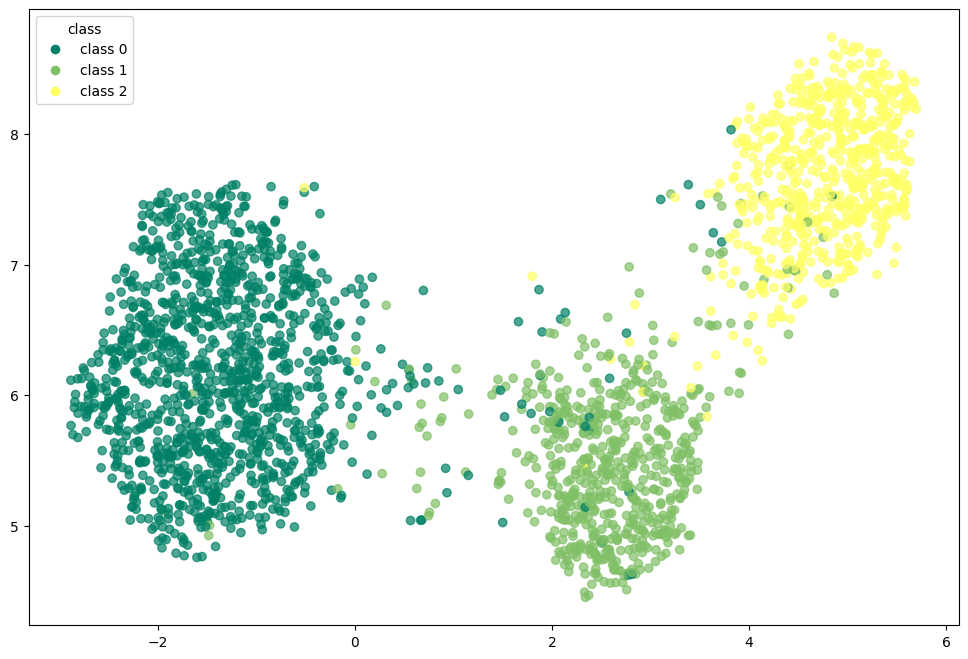

In [893]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',    
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

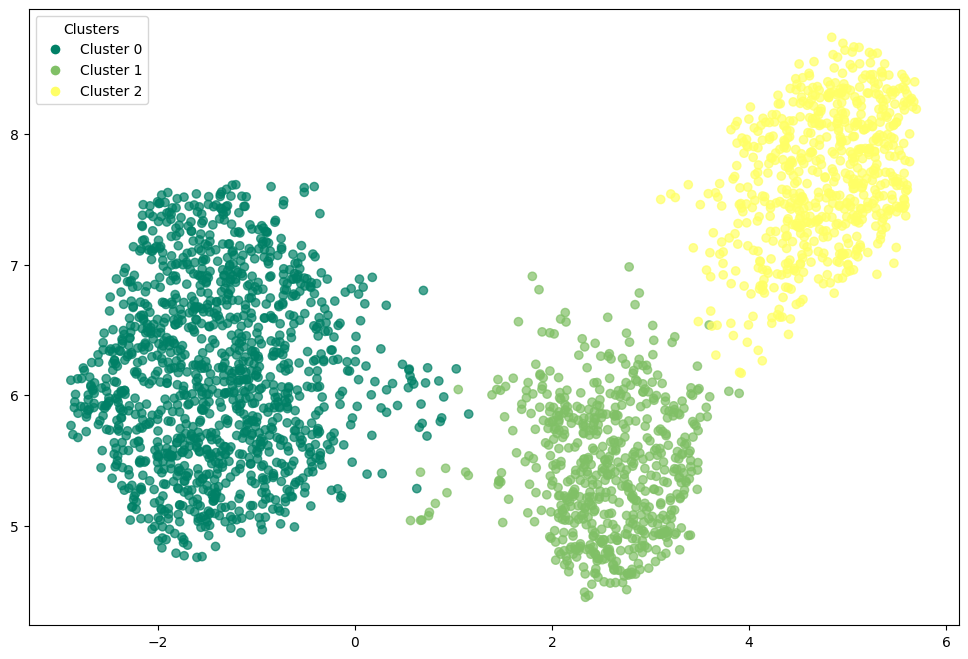

In [894]:
plt.figure(figsize=(12,8)) 
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['spectral_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_spectral['spectral_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [895]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[1213   30    7]
 [  22  572   31]
 [   2   11  612]]


In [896]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])) 

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      1250
           1       0.93      0.92      0.92       625
           2       0.94      0.98      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.95      0.95      2500
weighted avg       0.96      0.96      0.96      2500



In [897]:
adjusted_rand_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.8902300944821648

In [898]:
normalized_mutual_info_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.820743665421298

In [899]:
silhouette_score(df_umap_spectral.drop(columns=['target','spectral_umap']).values,df_umap_spectral['spectral_umap'])

0.6314913034439087

# accuracy and confusion matrix 

## k-means

In [900]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97      1250
           1       0.91      0.95      0.93       625
           2       0.95      0.98      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.96      2500
weighted avg       0.96      0.96      0.96      2500



In [901]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1193   47   10]
 [   5  595   25]
 [   0   14  611]]


## k-menas + pca

In [902]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97      1250
           1       0.90      0.95      0.92       625
           2       0.94      0.97      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.95      2500
weighted avg       0.96      0.96      0.96      2500



In [903]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1189   49   12]
 [   5  592   28]
 [   0   16  609]]


## k-means + t-SNE

In [904]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.90      0.95      1250
           1       0.82      0.94      0.88       625
           2       0.94      0.97      0.96       625

    accuracy                           0.93      2500
   macro avg       0.92      0.94      0.93      2500
weighted avg       0.94      0.93      0.93      2500



In [905]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[1130  115    5]
 [   3  588   34]
 [   1   15  609]]


## k-means + UMAP

In [906]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1250
           1       0.93      0.94      0.93       625
           2       0.95      0.98      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.96      2500
weighted avg       0.96      0.96      0.96      2500



In [907]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[1210   33    7]
 [  11  587   27]
 [   2   13  610]]


## Birch

In [908]:
print(classification_report(df_birch['target'],df_birch['birch']))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96      1250
           1       0.86      0.90      0.88       625
           2       0.95      0.90      0.92       625

    accuracy                           0.93      2500
   macro avg       0.92      0.92      0.92      2500
weighted avg       0.93      0.93      0.93      2500



In [909]:
print(confusion_matrix(df_birch['target'],df_birch['birch']))

[[1204   39    7]
 [  43  561   21]
 [  11   54  560]]


## Birch + pca

In [910]:
print(classification_report(df_pca_birch['target'],df_pca_birch['birch_pca']))

              precision    recall  f1-score   support

           0       0.99      0.94      0.97      1250
           1       0.84      0.97      0.90       625
           2       0.97      0.92      0.94       625

    accuracy                           0.94      2500
   macro avg       0.93      0.94      0.94      2500
weighted avg       0.95      0.94      0.95      2500



In [911]:
print(confusion_matrix(df_pca_birch['target'],df_pca_birch['birch_pca']))

[[1180   66    4]
 [   6  605   14]
 [   0   50  575]]


## Birch + t-SNE

In [912]:
print(classification_report(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

              precision    recall  f1-score   support

           0       0.98      0.93      0.95      1250
           1       0.82      0.92      0.87       625
           2       0.95      0.92      0.94       625

    accuracy                           0.93      2500
   macro avg       0.92      0.93      0.92      2500
weighted avg       0.93      0.93      0.93      2500



In [913]:
print(confusion_matrix(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

[[1162   84    4]
 [  20  578   27]
 [   2   45  578]]


## Birch + UMAP

In [914]:
print(classification_report(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1250
           1       0.93      0.94      0.93       625
           2       0.95      0.98      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.96      2500
weighted avg       0.96      0.96      0.96      2500



In [915]:
print(confusion_matrix(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

[[1210   33    7]
 [  11  587   27]
 [   2   13  610]]


## GMM

In [916]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1250
           1       0.94      0.93      0.94       625
           2       0.96      0.98      0.97       625

    accuracy                           0.97      2500
   macro avg       0.96      0.96      0.96      2500
weighted avg       0.97      0.97      0.97      2500



In [917]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1226   22    2]
 [  18  582   25]
 [   2   13  610]]


## GMM + pca

In [918]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.99      0.96      0.98      1250
           1       0.90      0.96      0.93       625
           2       0.97      0.96      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.96      2500
weighted avg       0.96      0.96      0.96      2500



In [919]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1205   43    2]
 [   7  599   19]
 [   1   22  602]]


## GMM + t-SNE

In [920]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.80      0.60      0.69      1250
           1       0.00      0.00      0.00       625
           2       0.58      0.99      0.73       625

    accuracy                           0.55      2500
   macro avg       0.46      0.53      0.47      2500
weighted avg       0.54      0.55      0.52      2500



In [921]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[751 486  13]
 [185   0 440]
 [  6   0 619]]


## GMM + UMAP

In [922]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      1250
           1       0.94      0.92      0.93       625
           2       0.94      0.98      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.95      2500
weighted avg       0.96      0.96      0.96      2500



In [923]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1216   27    7]
 [  22  573   30]
 [   2   11  612]]


## PAM

In [924]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[913 313  24]
 [  1 514 110]
 [  0   4 621]]


In [925]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       1.00      0.73      0.84      1250
           1       0.62      0.82      0.71       625
           2       0.82      0.99      0.90       625

    accuracy                           0.82      2500
   macro avg       0.81      0.85      0.82      2500
weighted avg       0.86      0.82      0.82      2500



## PAM + pca

In [926]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1188   55    7]
 [   4  598   23]
 [   0   18  607]]


In [927]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97      1250
           1       0.89      0.96      0.92       625
           2       0.95      0.97      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.95      2500
weighted avg       0.96      0.96      0.96      2500



## PAM + t-SNE

In [928]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1136  109    5]
 [   3  591   31]
 [   1   19  605]]


In [929]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.91      0.95      1250
           1       0.82      0.95      0.88       625
           2       0.94      0.97      0.96       625

    accuracy                           0.93      2500
   macro avg       0.92      0.94      0.93      2500
weighted avg       0.94      0.93      0.93      2500



## PAM + umap

In [930]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1210   33    7]
 [  12  586   27]
 [   2   13  610]]


In [931]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1250
           1       0.93      0.94      0.93       625
           2       0.95      0.98      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.96      2500
weighted avg       0.96      0.96      0.96      2500



## spectral clustering

In [932]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[1215   31    4]
 [  13  592   20]
 [   2   15  608]]


In [933]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1250
           1       0.93      0.95      0.94       625
           2       0.96      0.97      0.97       625

    accuracy                           0.97      2500
   macro avg       0.96      0.96      0.96      2500
weighted avg       0.97      0.97      0.97      2500



## spectral clustering + pca

In [934]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[1206   40    4]
 [  10  592   23]
 [   2   18  605]]


In [935]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       0.99      0.96      0.98      1250
           1       0.91      0.95      0.93       625
           2       0.96      0.97      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.96      0.96      2500
weighted avg       0.96      0.96      0.96      2500



## spectral clustering + t-SNE

In [936]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[1056  190    4]
 [   3  600   22]
 [   0   29  596]]


In [937]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.84      0.91      1250
           1       0.73      0.96      0.83       625
           2       0.96      0.95      0.96       625

    accuracy                           0.90      2500
   macro avg       0.90      0.92      0.90      2500
weighted avg       0.92      0.90      0.90      2500



## spectral clustering + umap

In [938]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[1213   30    7]
 [  22  572   31]
 [   2   11  612]]


In [939]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      1250
           1       0.93      0.92      0.92       625
           2       0.94      0.98      0.96       625

    accuracy                           0.96      2500
   macro avg       0.95      0.95      0.95      2500
weighted avg       0.96      0.96      0.96      2500



# external measures  

## k-means

In [940]:
scores = evaluate_clustering(df_kmeans.drop(['target','k_means'],axis=1).values, df_kmeans['target'], df_kmeans['k_means'])

In [941]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.890
NMI: 0.831
Silhouette: 0.153


## k-means + pca

In [942]:
scores = evaluate_clustering(df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values, df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

In [943]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.882
NMI: 0.819
Silhouette: 0.422


## k-means + tsne

In [944]:
scores = evaluate_clustering(df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values, df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

In [945]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.811
NMI: 0.768
Silhouette: 0.496


## k-means + umap

In [946]:
scores = evaluate_clustering(df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values, df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

In [947]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.901
NMI: 0.835
Silhouette: 0.632


##  Birch 

In [948]:
scores = evaluate_clustering(df_birch.drop(['target','birch'],axis=1).values, df_birch['target'], df_birch['birch'])

In [949]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.819
NMI: 0.728
Silhouette: 0.140


## Birch + pca

In [950]:
scores = evaluate_clustering(df_pca_birch.drop(['target','birch_pca'],axis=1).values, df_pca_birch['target'], df_pca_birch['birch_pca'])

In [951]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.852
NMI: 0.793
Silhouette: 0.404


## Birch + tsne

In [952]:
scores = evaluate_clustering(df_tsne_birch.drop(['target','birch_tsne'],axis=1).values, df_tsne_birch['target'], df_tsne_birch['birch_tsne'])

In [953]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.808
NMI: 0.737
Silhouette: 0.479


## Birch + umap

In [954]:
scores = evaluate_clustering(df_umap_birch.drop(['target','birch_umap'],axis=1).values, df_umap_birch['target'], df_umap_birch['birch_umap'])

In [955]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.901
NMI: 0.835
Silhouette: 0.632


## GMM

In [956]:
scores = evaluate_clustering(df_gmm.drop(['target','gmm'],axis=1).values, df_gmm['target'], df_gmm['gmm'])

In [957]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.914
NMI: 0.851
Silhouette: 0.152


## GMM + pca

In [958]:
scores = evaluate_clustering(df_pca_gmm.drop(['target','gmm_pca'],axis=1).values, df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

In [959]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.900
NMI: 0.841
Silhouette: 0.420


## GMM + tsne

In [960]:
scores = evaluate_clustering(df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values, df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

In [961]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.384
NMI: 0.501
Silhouette: 0.380


## GMM + umap

In [962]:
scores = evaluate_clustering(df_umap_gmm.drop(['target','gmm_umap'],axis=1).values, df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

In [963]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.895
NMI: 0.826
Silhouette: 0.632


## pam

In [964]:
scores = evaluate_clustering(df_pam.drop(['target','pam'],axis=1).values, df_pam['target'], df_pam['pam'])

In [965]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.563
NMI: 0.600
Silhouette: 0.135


## pam + pca

In [966]:
scores = evaluate_clustering(df_pam_pca.drop(['target','pam_pca'],axis=1).values, df_pam_pca['target'], df_pam_pca['pam_pca'])

In [967]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.884
NMI: 0.827
Silhouette: 0.420


## pam + tsne

In [968]:
scores = evaluate_clustering(df_pam_tsne.drop(['target','pam_tsne'],axis=1).values, df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

In [969]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.816
NMI: 0.770
Silhouette: 0.497


## pca + umap

In [970]:
scores = evaluate_clustering(df_pam_umap.drop(['target','pam_umap'],axis=1).values, df_pam_umap['target'], df_pam_umap['pam_umap'])

In [971]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.900
NMI: 0.834
Silhouette: 0.632


## spectral clustering

In [972]:
scores = evaluate_clustering(df_spectral.drop(['target','spectral_clustering'],axis=1).values, df_spectral['target'], df_spectral['spectral_clustering'])

In [973]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.909
NMI: 0.846
Silhouette: 0.152


## spectral clustering + pca

In [974]:
scores = evaluate_clustering(df_pca_spectral.drop(['target','spectral_pca'],axis=1).values, df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

In [975]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.896
NMI: 0.832
Silhouette: 0.421


## spectral clustering + tsne

In [976]:
scores = evaluate_clustering(df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values, df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

In [977]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.727
NMI: 0.718
Silhouette: 0.486


## spectral clustering + umap

In [978]:
scores = evaluate_clustering(df_umap_spectral.drop(['target','spectral_umap'],axis=1).values, df_umap_spectral['target'], df_umap_spectral['spectral_umap'])

In [979]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.890
NMI: 0.821
Silhouette: 0.631


# different correlation final metrics

| Metric | Requires Ground Truth | Score Range | Meaning |
|--------|---------------------|------------|---------|
| **ARI** | ✅ | [-1, 1] | 1 = perfect match, 0 = random, <0 worse than chance |
| **NMI** | ✅ | [0, 1] | 1 = perfect match, 0 = independent |
| **Silhouette Score** | ❌ | [-1, 1] | 1 = well-separated, 0 = boundary, <0 = misclassified |

In [2177]:
results = {}

def evaluate_and_store(name, X, y_true, y_pred):
    scores = evaluate_clustering(X, y_true, y_pred)
    results[name] = scores

# k-means
evaluate_and_store("k-means",
                   df_kmeans.drop(['target','k_means'],axis=1).values,
                   df_kmeans['target'], df_kmeans['k_means'])

evaluate_and_store("k-means + pca",
                   df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values,
                   df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

evaluate_and_store("k-means + tsne",
                   df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values,
                   df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

evaluate_and_store("k-means + umap",
                   df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values,
                   df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

# Birch
evaluate_and_store("Birch",
                   df_birch.drop(['target','birch'],axis=1).values,
                   df_birch['target'], df_birch['birch'])

evaluate_and_store("Birch + pca",
                   df_pca_birch.drop(['target','birch_pca'],axis=1).values,
                   df_pca_birch['target'], df_pca_birch['birch_pca'])

evaluate_and_store("Birch + tsne",
                   df_tsne_birch.drop(['target','birch_tsne'],axis=1).values,
                   df_tsne_birch['target'], df_tsne_birch['birch_tsne'])

evaluate_and_store("Birch + umap",
                   df_umap_birch.drop(['target','birch_umap'],axis=1).values,
                   df_umap_birch['target'], df_umap_birch['birch_umap'])

# GMM
evaluate_and_store("GMM",
                   df_gmm.drop(['target','gmm'],axis=1).values,
                   df_gmm['target'], df_gmm['gmm'])

evaluate_and_store("GMM + pca",
                   df_pca_gmm.drop(['target','gmm_pca'],axis=1).values,
                   df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

evaluate_and_store("GMM + tsne",
                   df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values,
                   df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

evaluate_and_store("GMM + umap",
                   df_umap_gmm.drop(['target','gmm_umap'],axis=1).values,
                   df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

# PAM
evaluate_and_store("PAM",
                   df_pam.drop(['target','pam'],axis=1).values,
                   df_pam['target'], df_pam['pam'])

evaluate_and_store("PAM + pca",
                   df_pam_pca.drop(['target','pam_pca'],axis=1).values,
                   df_pam_pca['target'], df_pam_pca['pam_pca'])

evaluate_and_store("PAM + tsne",
                   df_pam_tsne.drop(['target','pam_tsne'],axis=1).values,
                   df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

evaluate_and_store("PAM + umap",
                   df_pam_umap.drop(['target','pam_umap'],axis=1).values,
                   df_pam_umap['target'], df_pam_umap['pam_umap'])

# Spectral clustering
evaluate_and_store("Spectral Clustering",
                   df_spectral.drop(['target','spectral_clustering'],axis=1).values,
                   df_spectral['target'], df_spectral['spectral_clustering'])

evaluate_and_store("Spectral Clustering + pca",
                   df_pca_spectral.drop(['target','spectral_pca'],axis=1).values,
                   df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

evaluate_and_store("Spectral Clustering + tsne",
                   df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values,
                   df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

evaluate_and_store("Spectral Clustering + umap",
                   df_umap_spectral.drop(['target','spectral_umap'],axis=1).values,
                   df_umap_spectral['target'], df_umap_spectral['spectral_umap'])


df_results = pd.DataFrame(results).T  
df_results = df_results.round(3)    

print(df_results)

                              ARI    NMI  Silhouette
k-means                     0.890  0.831       0.153
k-means + pca               0.882  0.819       0.422
k-means + tsne              0.811  0.768       0.496
k-means + umap              0.901  0.835       0.632
Birch                       0.819  0.728       0.140
Birch + pca                 0.852  0.793       0.404
Birch + tsne                0.808  0.737       0.479
Birch + umap                0.901  0.835       0.632
GMM                         0.914  0.851       0.152
GMM + pca                   0.900  0.841       0.420
GMM + tsne                  0.384  0.501       0.380
GMM + umap                  0.895  0.826       0.632
PAM                         0.563  0.600       0.135
PAM + pca                   0.884  0.827       0.420
PAM + tsne                  0.816  0.770       0.497
PAM + umap                  0.900  0.834       0.632
Spectral Clustering         0.909  0.846       0.152
Spectral Clustering + pca   0.896  0.832      

In [2178]:
if N_SAMPLE == 2500 and N_FEATURES == 15:
    folder = "2500_15"
elif N_SAMPLE == 5000 and N_FEATURES == 10:
    folder = "5000_10"
elif N_SAMPLE == 10000 and N_FEATURES == 5:
    folder = "10000_5"

os.makedirs(folder, exist_ok=True)

filename = f"X_{N_CLUSTER}_{CORRELATION}_{NOISE_STD}.csv"
filepath = os.path.join(folder, filename)
df_results.to_csv(filepath, index=True)

## ARI index

The **Adjusted Rand Index (ARI)** is a measure of similarity between two clusterings — typically the ground truth labels and the predicted cluster labels.  
It quantifies how well the clustering algorithm recovers the true class structure while correcting for chance.  

1. Count pairs of points that are either:
   - in the same cluster in both labelings (**agreement**)  
   - in different clusters in both labelings (**agreement**)  
2. Compute the **Rand Index (RI)** as the ratio of agreements to total pairs.  
3. Adjust the RI for chance grouping to get **ARI**, which can be negative (worse than random), 0 (random), or 1 (perfect agreement).

**Strengths**
- Adjusts for chance; more reliable than raw Rand Index  
- Works for any number of clusters and unbalanced datasets  

**Weaknesses**
- Requires **ground truth labels**  
- Not meaningful if true labels are unknown  


In [2445]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2446]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2447]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2448]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [2449]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2450]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2451]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2452]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [2453]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2454]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2455]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2456]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [2457]:
ari = {}

In [2458]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1'):df_3_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5'):df_3_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9'):df_3_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1'):df_5_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5'):df_5_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9'):df_5_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1'):df_7_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5'):df_7_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9'):df_7_cluster['ARI'].values,
        }
)

In [2459]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2460]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"ari_dataset/ari_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [2461]:
ari_2500_15 = pd.read_csv("ari_dataset/ari_2500_15.csv", header=[0,1,2])

### dataset

In [2462]:
ari_2500_15.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2463]:
ari_5000_10 = pd.read_csv("ari_dataset/ari_5000_10.csv", header=[0,1,2])

In [2464]:
ari_5000_10.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2465]:
ari_10000_5 = pd.read_csv("ari_dataset/ari_10000_5.csv", header=[0,1,2])

In [2466]:
ari_10000_5.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

## NMI index

**Normalized Mutual Information (NMI)** measures the similarity between two clusterings based on **information theory**.  
It quantifies how much information about the true labels is captured by the clustering, normalized to account for differences in cluster sizes and counts.

1. Compute **mutual information (MI)** between the true labels and predicted clusters: how much knowing one reduces uncertainty about the other.  
2. Normalize by the average entropy of the two labelings to scale the score between 0 and 1:
   - `0` → no mutual information (completely independent)  
   - `1` → perfect correlation

**Strengths**
- Scales from 0 to 1, easy to interpret  
- Handles unbalanced clusters  
- Does not require clusters to have the same number of points  

**Weaknesses**
- Requires **ground truth labels**  
- Sensitive to noise and small clusters  

In [2467]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2468]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2469]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2470]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [2471]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2472]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2473]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2474]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [2475]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2476]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2477]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2478]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [2479]:
nmi = {}

In [2480]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1'):df_3_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5'):df_3_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9'):df_3_cluster['NMI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1'):df_5_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5'):df_5_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9'):df_5_cluster['NMI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1'):df_7_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5'):df_7_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9'):df_7_cluster['NMI'].values,
        }
)

In [2481]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2482]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"nmi_dataset/nmi_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [2483]:
nmi_2500_15 = pd.read_csv("nmi_dataset/nmi_2500_15.csv", header=[0,1,2])

### dataset

In [2484]:
nmi_2500_15.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2485]:
nmi_5000_10 = pd.read_csv("nmi_dataset/nmi_5000_10.csv", header=[0,1,2])

In [2486]:
nmi_5000_10.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2487]:
nmi_10000_5 = pd.read_csv("nmi_dataset/nmi_10000_5.csv", header=[0,1,2])

In [2488]:
nmi_10000_5.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

## Silhouette score 

The **Silhouette Score** is an **intrinsic evaluation metric** that measures how well-separated and cohesive clusters are **without ground truth labels**.

For each point `i`:
1. Compute `a(i)` = average distance to all other points in the **same cluster** (cohesion).  
2. Compute `b(i)` = minimum average distance to all points in the **nearest other cluster** (separation).  
3. Silhouette score `s(i)`:

* s(i) = ( b(i) - a(i) ) / max( a(i), b(i) )


4. Overall silhouette score = average of `s(i)` across all points.

- `s ≈ 1` → point is well-matched to its cluster, far from others  
- `s ≈ 0` → point lies near the cluster boundary  
- `s < 0` → point may be misclassified  

**Strengths**
- Works **without ground truth labels**  
- Measures both **cohesion** and **separation**  
- Useful for choosing the **number of clusters**  

**Weaknesses**
- Computationally expensive for large datasets  
- Sensitive to the choice of distance metric  

In [2489]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2490]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2491]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2492]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [2493]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2494]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2495]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2496]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [2497]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2498]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2499]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2500]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [2501]:
silhouette = {}

In [2502]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1'):df_3_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5'):df_3_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9'):df_3_cluster['Silhouette'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1'):df_5_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5'):df_5_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9'):df_5_cluster['Silhouette'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1'):df_7_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5'):df_7_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9'):df_7_cluster['Silhouette'].values,
        }
)

In [2503]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2504]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"silhoutte_dataset/silhouette_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [2505]:
silhouette_2500_15 = pd.read_csv("silhoutte_dataset/silhouette_2500_15.csv", header=[0,1,2])

### dataset

In [2506]:
silhouette_2500_15.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2507]:
silhouette_5000_10 = pd.read_csv("silhoutte_dataset/silhouette_5000_10.csv", header=[0,1,2])

In [2508]:
silhouette_5000_10.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2509]:
silhouette_10000_5 = pd.read_csv("silhoutte_dataset/silhouette_10000_5.csv", header=[0,1,2])

In [2510]:
silhouette_10000_5.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

# different noise final metrics

| Metric | Requires Ground Truth | Score Range | Meaning |
|--------|---------------------|------------|---------|
| **ARI** | ✅ | [-1, 1] | 1 = perfect match, 0 = random, <0 worse than chance |
| **NMI** | ✅ | [0, 1] | 1 = perfect match, 0 = independent |
| **Silhouette Score** | ❌ | [-1, 1] | 1 = well-separated, 0 = boundary, <0 = misclassified |

## ARI index

The **Adjusted Rand Index (ARI)** is a measure of similarity between two clusterings — typically the ground truth labels and the predicted cluster labels.  
It quantifies how well the clustering algorithm recovers the true class structure while correcting for chance.  

1. Count pairs of points that are either:
   - in the same cluster in both labelings (**agreement**)  
   - in different clusters in both labelings (**agreement**)  
2. Compute the **Rand Index (RI)** as the ratio of agreements to total pairs.  
3. Adjust the RI for chance grouping to get **ARI**, which can be negative (worse than random), 0 (random), or 1 (perfect agreement).

**Strengths**
- Adjusts for chance; more reliable than raw Rand Index  
- Works for any number of clusters and unbalanced datasets  

**Weaknesses**
- Requires **ground truth labels**  
- Not meaningful if true labels are unknown  


In [2511]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2512]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2513]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2514]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [2515]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2516]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2517]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2518]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [2519]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2520]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2521]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2522]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [2523]:
ari = {}

In [2524]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}_noise"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '5'):df_3_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '7'):df_3_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '9'):df_3_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '5'):df_5_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '7'):df_5_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '9'):df_5_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '5'):df_7_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '7'):df_7_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '9'):df_7_cluster['ARI'].values,
        }
)

In [2525]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}_noise"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2526]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}_noise"].to_csv(f"ari_dataset/ari_{N_SAMPLE}_{N_FEATURES}_noise.csv", index=False)

In [2527]:
ari_2500_15_noise = pd.read_csv("ari_dataset/ari_2500_15_noise.csv", header=[0,1,2])

### dataset

In [2528]:
ari_2500_15_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2529]:
ari_5000_10_noise = pd.read_csv("ari_dataset/ari_5000_10_noise.csv", header=[0,1,2])

In [2530]:
ari_5000_10_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2531]:
ari_10000_5_noise = pd.read_csv("ari_dataset/ari_10000_5_noise.csv", header=[0,1,2])

In [2532]:
ari_10000_5_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

## NMI index

**Normalized Mutual Information (NMI)** measures the similarity between two clusterings based on **information theory**.  
It quantifies how much information about the true labels is captured by the clustering, normalized to account for differences in cluster sizes and counts.

1. Compute **mutual information (MI)** between the true labels and predicted clusters: how much knowing one reduces uncertainty about the other.  
2. Normalize by the average entropy of the two labelings to scale the score between 0 and 1:
   - `0` → no mutual information (completely independent)  
   - `1` → perfect correlation

**Strengths**
- Scales from 0 to 1, easy to interpret  
- Handles unbalanced clusters  
- Does not require clusters to have the same number of points  

**Weaknesses**
- Requires **ground truth labels**  
- Sensitive to noise and small clusters  

In [2533]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2534]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2535]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2536]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [2537]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2538]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2539]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2540]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [2541]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2542]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2543]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2544]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [2545]:
nmi = {}

In [2546]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}_noise"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '5'):df_3_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '7'):df_3_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '9'):df_3_cluster['NMI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '5'):df_5_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '7'):df_5_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '9'):df_5_cluster['NMI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '5'):df_7_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '7'):df_7_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '9'):df_7_cluster['NMI'].values,
        }
)

In [2547]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}_noise"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2548]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}_noise"].to_csv(f"nmi_dataset/nmi_{N_SAMPLE}_{N_FEATURES}_noise.csv", index=False)

In [2549]:
nmi_2500_15_noise = pd.read_csv("nmi_dataset/nmi_2500_15_noise.csv", header=[0,1,2])

### dataset

In [2550]:
nmi_2500_15_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2551]:
nmi_5000_10_noise = pd.read_csv("nmi_dataset/nmi_5000_10_noise.csv", header=[0,1,2])

In [2552]:
nmi_5000_10_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2553]:
nmi_10000_5_noise = pd.read_csv("nmi_dataset/nmi_10000_5_noise.csv", header=[0,1,2])

In [2554]:
nmi_10000_5_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

## Silhouette score 

The **Silhouette Score** is an **intrinsic evaluation metric** that measures how well-separated and cohesive clusters are **without ground truth labels**.

For each point `i`:
1. Compute `a(i)` = average distance to all other points in the **same cluster** (cohesion).  
2. Compute `b(i)` = minimum average distance to all points in the **nearest other cluster** (separation).  
3. Silhouette score `s(i)`:

* s(i) = ( b(i) - a(i) ) / max( a(i), b(i) )


4. Overall silhouette score = average of `s(i)` across all points.

- `s ≈ 1` → point is well-matched to its cluster, far from others  
- `s ≈ 0` → point lies near the cluster boundary  
- `s < 0` → point may be misclassified  

**Strengths**
- Works **without ground truth labels**  
- Measures both **cohesion** and **separation**  
- Useful for choosing the **number of clusters**  

**Weaknesses**
- Computationally expensive for large datasets  
- Sensitive to the choice of distance metric  

In [2555]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2556]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2557]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2558]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [2559]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2560]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2561]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2562]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [2563]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2564]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2565]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [2566]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [2567]:
silhouette = {}

In [2568]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}_noise"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '5'):df_3_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '7'):df_3_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '9'):df_3_cluster['Silhouette'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '5'):df_5_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '7'):df_5_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '9'):df_5_cluster['Silhouette'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '5'):df_7_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '7'):df_7_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '9'):df_7_cluster['Silhouette'].values,
        }
)

In [2569]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}_noise"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2570]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}_noise"].to_csv(f"silhoutte_dataset/silhouette_{N_SAMPLE}_{N_FEATURES}_noise.csv", index=False)

In [2571]:
silhouette_2500_15_noise = pd.read_csv("silhoutte_dataset/silhouette_2500_15_noise.csv", header=[0,1,2])

### dataset

In [2572]:
silhouette_2500_15_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2573]:
silhouette_5000_10_noise = pd.read_csv("silhoutte_dataset/silhouette_5000_10_noise.csv", header=[0,1,2])

In [2574]:
silhouette_5000_10_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [2575]:
silhouette_10000_5_noise = pd.read_csv("silhoutte_dataset/silhouette_10000_5_noise.csv", header=[0,1,2])

In [2576]:
silhouette_10000_5_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])